# Disaster at St. Himark!: Citizen Science to the Rescue
## Background
St. Himark is a vibrant community located in the Oceanus Sea. Home to the world-renowned St. Himark Museum, beautiful beaches, and the Wilson Forest Nature Preserve, St. Himark is one of the region’s best cities for raising a family and provides employment across a number of industries including the Always Safe Nuclear Power Plant. Well, all that was true before the disastrous earthquake that hits the area during the course of this year’s challenge. Mayor Jordan, city officials, and emergency services are overwhelmed and are desperate for assistance in understanding the true situation on the ground and how best to deploy the limited resources available to this relatively small community.

One of St. Himark’s largest employers is the Always Safe nuclear power plant. The pride of the city, it produces power for St. Himark’s needs and exports the excess to the mainland providing a steady revenue stream. However, the plant was not compliant with international standards when it was constructed and is now aging. As part of its outreach to the broader community, Always Safe agreed to provide funding for a set of carefully calibrated professional radiation monitors at fixed locations throughout the city. Additionally, a group of citizen scientists led by the members of the Himark Science Society started an education initiative to build and deploy lower cost homemade sensors, which people can attach to their cars. The sensors upload data to the web by connecting through the user’s cell phone. The goal of the project was to engage the community and demonstrate that the nuclear plant’s operations were not significantly changing the region’s natural background levels of radiation.

When an earthquake strikes St. Himark, the nuclear power plant suffers damage resulting in a leak of radioactive contamination. Further, a coolant leak sprayed employees’ cars and contaminated them at varying levels. Now, the city’s government and emergency management officials are trying to understand if there is a risk to the public while also responding to other emerging crises related to the earthquake as well as satisfying the public’s concern over radiation.

You will find two data files spanning the entire length of the events (12 am on April 6, 2020 to 11:59 pm on April 10, 2020), containing radiation measurements from mobile and static radiation sensors.  We also provide a set of supporting files. Be prepared for missing and corrupted data, skipped timesteps, and other issues. Both radiation measurements and movements may be affected by conditions in the city.

### Goals
Your task, as supported by data analytics that you apply, is to help St. Himark’s emergency management team combine data from the government-operated stationary monitors with data from citizen-operated mobile sensors to help them better understand conditions in the city and identify likely locations that will require further monitoring, cleanup, or even evacuation. Will data from citizen scientists clarify the situation or make it more uncertain? Use data and visual analytics to develop responses to the questions below.

1. Visualize radiation measurements over time from both static and mobile sensors to identify areas where radiation over background is detected. Characterize changes over time.

2. Use data analytics to represent and analyze uncertainty in the measurement of radiation across the city.
    1. Compare uncertainty of the static sensors to the mobile sensors. What anomalies can you see? Are there sensors that are too uncertain to trust?
    2. Which regions of the city have greater uncertainty of radiation measurement? Use data analytics to explain your rationale.
    3. What effects do you see in the sensor readings after the earthquake and other major events? What effect do these events have on uncertainty?

3. Given the uncertainty you observed in question 2, are the radiation measurements reliable enough to locate areas of concern?
    1. Highlight potential locations of contamination, including the locations of contaminated cars. Should St. Himark officials be worried about contaminated cars moving around the city?
    2. Estimate how many cars may have been contaminated when coolant leaked from the Always Safe plant. Use data analysis of radiation measurements to determine if any have left the area.
    3. Indicated where you would deploy more sensors to improve radiation monitoring in the city. Would you recommend more static sensors or more mobile sensors or both? Use your analysis of radiation measurement uncertainty to justify your recommendation.

4. Summarize the state of radiation measurements at the end of the available period. Use your data analysis approaches to suggest a course of action for the city. Use analytics to compare the static sensor network to the mobile sensor network. What are the strengths and weaknesses of each approach? How do they support each other?


Part 1: Visualize radiation measurements over time from both static and mobile sensors to identify areas where radiation over background is detected. Characterize changes over time.

### Load static data

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from PIL import Image
from shapely.geometry import Point
import seaborn as sns; sns.set(style="ticks", color_codes=True)
import plotly.express as px
import numpy as np

In [2]:
from google.colab import drive

# load Google Drive
drive.mount('/content/drive')

# read static location csv
staLocation = pd.read_csv('/content/drive/My Drive/data/StaticSensorLocations.csv')

Mounted at /content/drive


In [ ]:
staLocation

,Sensor-id,Lat,Long
0,12,0.20764,-119.81556
1,15,0.16849,-119.79033
2,13,0.15979,-119.80715
3,11,0.04147,-119.82861
4,6,0.12180,-119.90430
5,1,0.15689,-119.95940
6,9,0.18299,-119.85558
7,14,0.12180,-119.79265
8,4,0.15109,-119.90952


In [ ]:
print(staLocation.columns)

Index(['Sensor-id', 'Lat', 'Long'], dtype='object')


In [ ]:
staLocation['Location'] = staLocation.apply(lambda row: Point((row['Long'], row['Lat'])), axis=1)

In [ ]:
staLocation

,Sensor-id,Lat,Long,Location
0,12,0.20764,-119.81556,POINT (-119.81556 0.20764)
1,15,0.16849,-119.79033,POINT (-119.79033 0.16849)
2,13,0.15979,-119.80715,POINT (-119.80715 0.15979)
3,11,0.04147,-119.82861,POINT (-119.82861 0.04147)
4,6,0.12180,-119.90430,POINT (-119.9043 0.1218)
5,1,0.15689,-119.95940,POINT (-119.9594 0.15689)
6,9,0.18299,-119.85558,POINT (-119.85558 0.18299)
7,14,0.12180,-119.79265,POINT (-119.79265 0.1218)
8,4,0.15109,-119.90952,POINT (-119.90952 0.15109)


In [ ]:
print(staLocation.dtypes)

Sensor-id      int64
Lat          float64
Long         float64
Location      object
dtype: object


### 1. the localization of static sensors

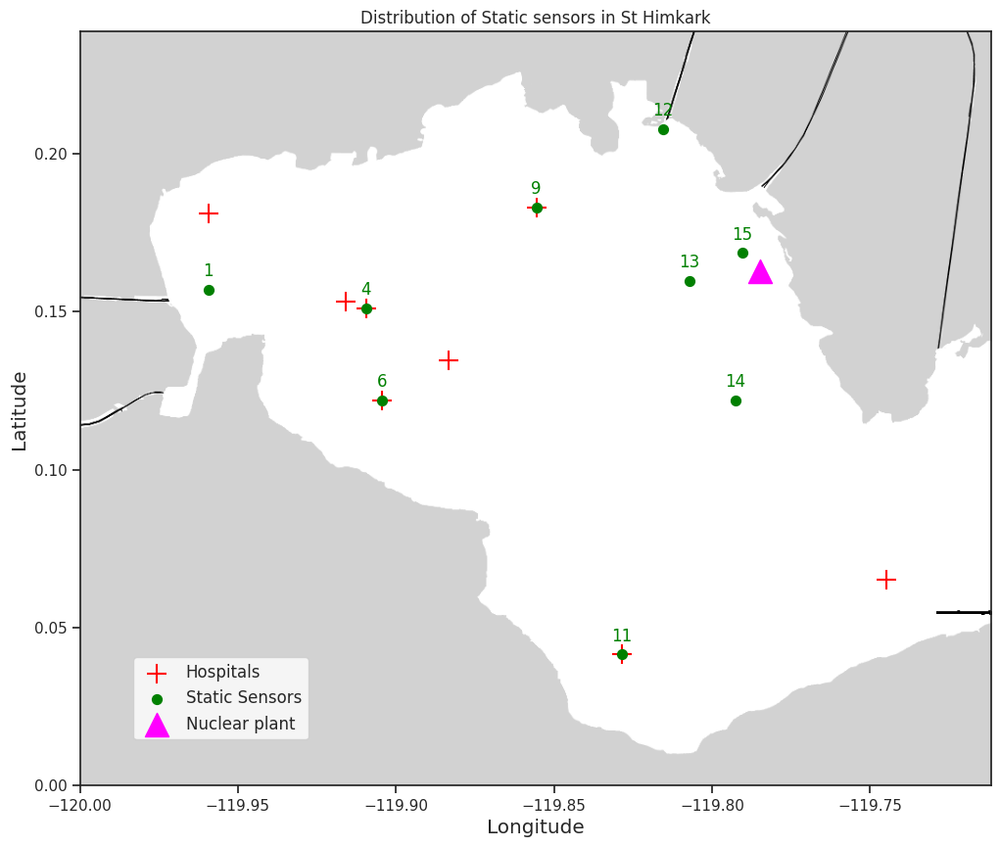

In [ ]:
# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# defin the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_static_sensors = gpd.GeoDataFrame(staLocation, geometry='Location')
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])

# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot the GeoDataFrame
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_static_sensors.plot(ax=ax, color='green', marker='o', markersize=50, label='Static Sensors')
gdf_nuclear_plant.plot(ax=ax, color = 'magenta', marker = '^', markersize=300, label='Nuclear plant')

# Annotate static sensors
for idx, row in gdf_static_sensors.iterrows():
    ax.annotate(row['Sensor-id'],
                (row['Location'].x, row['Location'].y),
                textcoords="offset points",
                xytext=(0, 10),
                ha='center', fontsize=12,
                color='green')

# Add labels or other annotations as needed
ax.set_title('Distribution of Static sensors in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()

In [ ]:
staReadings = pd.read_csv('/content/drive/My Drive/data/StaticSensorReadings.csv')
staReadings

,Timestamp,Sensor-id,Value,Units
0,2020-04-06 00:00:00,15,11.926,cpm
1,2020-04-06 00:00:00,6,14.816,cpm
2,2020-04-06 00:00:00,1,17.055,cpm
3,2020-04-06 00:00:00,12,16.787,cpm
4,2020-04-06 00:00:00,13,15.009,cpm
...,...,...,...,...
743995,2020-04-10 23:59:45,15,10.670,cpm
743996,2020-04-10 23:59:45,4,17.754,cpm
743997,2020-04-10 23:59:45,11,16.331,cpm
743998,2020-04-10 23:59:45,9,16.203,cpm


In [ ]:
print(staReadings.dtypes)

Timestamp     object
Sensor-id      int64
Value        float64
Units         object
dtype: object


In [ ]:
# Merge static Location and static readings
staticDF = pd.merge(staLocation, staReadings, on='Sensor-id', how='inner')

In [ ]:
staticDF

,Sensor-id,Lat,Long,Location,Timestamp,Value,Units
0,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:00,16.787,cpm
1,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:05,13.800,cpm
2,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:10,14.037,cpm
3,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:15,14.051,cpm
4,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:20,14.401,cpm
...,...,...,...,...,...,...,...
743995,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:25,14.979,cpm
743996,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:30,13.748,cpm
743997,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:35,15.185,cpm
743998,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:40,15.469,cpm


In [ ]:
print(staticDF.dtypes)

Sensor-id      int64
Lat          float64
Long         float64
Location      object
Timestamp     object
Value        float64
Units         object
dtype: object


In [ ]:

staticDF['Timestamp'] = pd.to_datetime(staticDF['Timestamp'], format='%Y-%m-%d %H:%M:%S')

In [ ]:
print(staticDF.dtypes)

Sensor-id             int64
Lat                 float64
Long                float64
Location             object
Timestamp    datetime64[ns]
Value               float64
Units                object
dtype: object


In [ ]:
print(staticDF.isnull().sum())

Sensor-id    0
Lat          0
Long         0
Location     0
Timestamp    0
Value        0
Units        0
dtype: int64


In [ ]:
# calculate the number of value is 0
zero_counts = staticDF[staticDF['Value'] == 0].shape[0]
zero_counts

0

In [ ]:
staticDF

,Sensor-id,Lat,Long,Location,Timestamp,Value,Units
0,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:00,16.787,cpm
1,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:05,13.800,cpm
2,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:10,14.037,cpm
3,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:15,14.051,cpm
4,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:20,14.401,cpm
...,...,...,...,...,...,...,...
743995,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:25,14.979,cpm
743996,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:30,13.748,cpm
743997,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:35,15.185,cpm
743998,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:40,15.469,cpm


    5-60 CPM: Normal background radiation. Safe and typical for most environments.
    60-100 CPM: Slightly elevated but generally still safe. This could occur in areas with higher natural radiation or in environments where materials like granite are present.
    100-300 CPM: Higher than average. May warrant investigation, especially if sustained. This level could occur due to nearby radioactive materials or certain industrial activities.
    300+ CPM: Potentially concerning, especially if sustained or increasing. This could indicate contamination or a leak from a radioactive source.

In [ ]:
print(f"The min of Values is {staticDF['Value'].min()}")
print(f"The max of Values is {staticDF['Value'].max()}")
print(f"The starting time is {staticDF['Timestamp'].min()}")
print(f"The ending time is {staticDF['Timestamp'].max()}")

The min of Values is -20.238
The max of Values is 1165.9
The starting time is 2020-04-06 00:00:00
The ending time is 2020-04-10 23:59:45


In [ ]:
print(staticDF.dtypes)

Sensor-id             int64
Lat                 float64
Long                float64
Location             object
Timestamp    datetime64[ns]
Value               float64
Units                object
dtype: object


Sensor-id
12    86398
13    86398
11    86398
6     86398
1     86398
9     86398
14    86398
4     86398
15    52816
Name: count, dtype: int64


Text(0, 0.5, 'Counts')

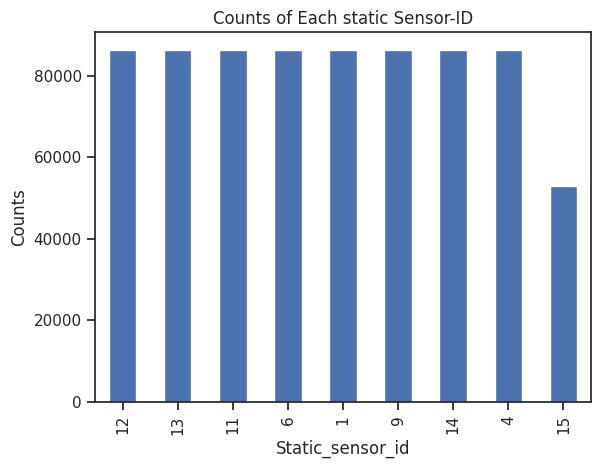

In [ ]:
sensor_counts = staticDF['Sensor-id'].value_counts()

print(sensor_counts)

sensor_counts.plot(kind='bar')

plt.title('Counts of Each static Sensor-ID')
plt.xlabel('Static_sensor_id')
plt.ylabel('Counts')

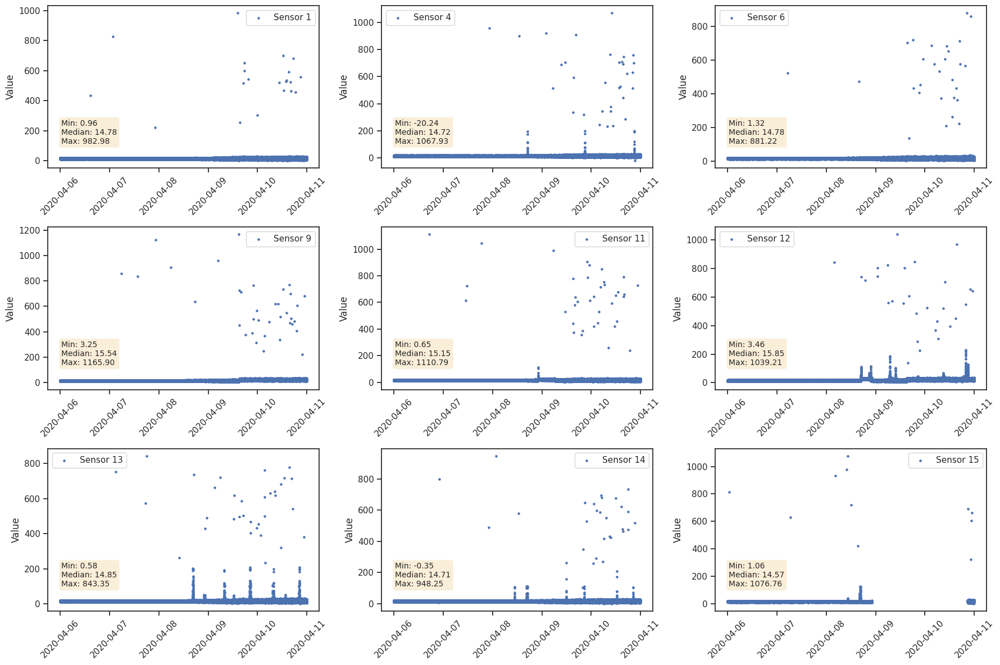

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(staticDF['Sensor-id'].unique())

nrows = (len(sensor_ids) + 1) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = staticDF[staticDF['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

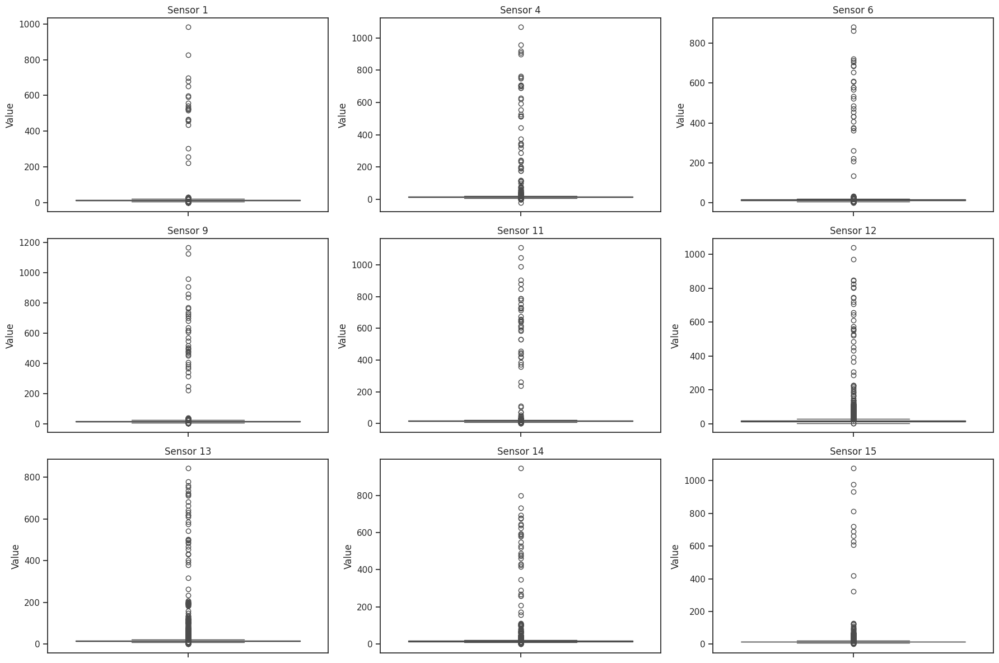

In [ ]:
# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = staticDF[staticDF['Sensor-id'] == sensor_id]
    sns.boxplot(y=sensor_data['Value'], ax=axes[i])
    axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].set_ylabel('Value')


# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
df_less_60 = staticDF[staticDF['Value'] < 60]

# Group by Sensor-id and count the number of rows for each sensor
count_per_sensor = df_less_60.groupby('Sensor-id').size()

# Reset index to get a clean DataFrame (optional)
count_per_sensor = count_per_sensor.reset_index(name='Count')

print(count_per_sensor)

   Sensor-id  Count
0          1  86377
1          4  86348
2          6  86370
3          9  86362
4         11  86357
5         12  86259
6         13  86252
7         14  86342
8         15  52777


In [ ]:
df_60_to_100 = staticDF[(staticDF['Value'] >= 60) & (staticDF['Value'] < 100)]

# Group by Sensor-id and count the number of rows for each sensor
count_per_sensor = df_60_to_100.groupby('Sensor-id').size()

# Reset index to get a clean DataFrame (optional)
count_per_sensor = count_per_sensor.reset_index(name='Count')

print(count_per_sensor)

   Sensor-id  Count
0          4      6
1         11      2
2         12     71
3         13     56
4         14     16
5         15     22


In [ ]:
df_100_to_300 = staticDF[(staticDF['Value'] >= 100) & (staticDF['Value'] < 300)]

# Group by Sensor-id and count the number of rows for each sensor
count_per_sensor = df_100_to_300.groupby('Sensor-id').size()

# Reset index to get a clean DataFrame (optional)
count_per_sensor = count_per_sensor.reset_index(name='Count')

print(count_per_sensor)

   Sensor-id  Count
0          1      2
1          4     16
2          6      4
3          9      2
4         11      4
5         12     42
6         13     59
7         14     16
8         15      6


In [ ]:
df_300_plus = staticDF[staticDF['Value'] >= 300]

# Group by Sensor-id and count the number of rows for each sensor
count_per_sensor = df_300_plus.groupby('Sensor-id').size()

# Reset index to get a clean DataFrame (optional)
count_per_sensor = count_per_sensor.reset_index(name='Count')

print(count_per_sensor)

   Sensor-id  Count
0          1     19
1          4     28
2          6     24
3          9     34
4         11     35
5         12     26
6         13     31
7         14     24
8         15     11


In [ ]:
staSensorMapDF = staticDF.copy()

In [ ]:
staSensorMapDF

,Sensor-id,Lat,Long,Location,Timestamp,Value,Units,Date,Hour,Minute,Duration,Duration_from_start
0,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:00,16.787,cpm,2020-04-06,0,0,0.0,0.0
1,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:05,13.800,cpm,2020-04-06,0,0,0.0,0.0
2,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:10,14.037,cpm,2020-04-06,0,0,0.0,0.0
3,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:15,14.051,cpm,2020-04-06,0,0,0.0,0.0
4,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:20,14.401,cpm,2020-04-06,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
743995,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:25,14.979,cpm,2020-04-10,23,59,1439.0,7199.0
743996,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:30,13.748,cpm,2020-04-10,23,59,1439.0,7199.0
743997,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:35,15.185,cpm,2020-04-10,23,59,1439.0,7199.0
743998,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:40,15.469,cpm,2020-04-10,23,59,1439.0,7199.0


Fill missing data for sensor 15 as 0 for later easily making animation.

In [ ]:
# Fill missing data for sensor 15
min_timestamp = staSensorMapDF['Timestamp'].min()
max_timestamp = staSensorMapDF['Timestamp'].max()
all_timestamps = pd.date_range(start=min_timestamp, end=max_timestamp, freq='5s')
print(len(all_timestamps))
sensor_15_data = staSensorMapDF[staSensorMapDF['Sensor-id'] == 15].set_index('Timestamp').reindex(all_timestamps).reset_index()
sensor_15_data.rename(columns={'index': 'Timestamp'}, inplace=True)
sensor_15_data['Timestamp'] = pd.to_datetime(sensor_15_data['Timestamp'])
sensor_15_data['Date']= sensor_15_data['Timestamp'].dt.date
sensor_15_data['Hour'] = sensor_15_data['Timestamp'].dt.hour
sensor_15_data['Minute'] = sensor_15_data['Timestamp'].dt.minute
# Compute duration from start of the day to the current time in minutes
sensor_15_data['Duration'] = sensor_15_data['Timestamp'].apply(lambda ts: (ts - ts.replace(hour=0, minute=0, second=0, microsecond=0)).total_seconds() // 60)
# Find the first day in the data
first_day = pd.Timestamp('2020-04-06')

# Compute duration from the first day of data to the current time in minutes
sensor_15_data['Duration_from_start'] = sensor_15_data['Timestamp'].apply(lambda ts: (ts - first_day).total_seconds() // 60)
sensor_15_data['Sensor-id'] = 15
sensor_15_data['Location'] = Point(-119.79033, 0.16849)
sensor_15_data['Lat'] = float(0.16849)
sensor_15_data['Long'] = float(-119.79033)
sensor_15_data['Value'] = sensor_15_data['Value'].fillna(0)  # Setting missing values to 0
print(sensor_15_data.shape)

86398
(86398, 12)


In [ ]:
sensor_15_data.tail(5000)

,Timestamp,Sensor-id,Lat,Long,Location,Value,Units,Date,Hour,Minute,Duration,Duration_from_start
81398,2020-04-10 17:03:10,15,0.16849,-119.79033,POINT (-119.79033 0.16849),0.000,NaN,2020-04-10,17,3,1023.0,6783.0
81399,2020-04-10 17:03:15,15,0.16849,-119.79033,POINT (-119.79033 0.16849),0.000,NaN,2020-04-10,17,3,1023.0,6783.0
81400,2020-04-10 17:03:20,15,0.16849,-119.79033,POINT (-119.79033 0.16849),0.000,NaN,2020-04-10,17,3,1023.0,6783.0
81401,2020-04-10 17:03:25,15,0.16849,-119.79033,POINT (-119.79033 0.16849),0.000,NaN,2020-04-10,17,3,1023.0,6783.0
81402,2020-04-10 17:03:30,15,0.16849,-119.79033,POINT (-119.79033 0.16849),0.000,NaN,2020-04-10,17,3,1023.0,6783.0
...,...,...,...,...,...,...,...,...,...,...,...,...
86393,2020-04-10 23:59:25,15,0.16849,-119.79033,POINT (-119.79033 0.16849),21.024,cpm,2020-04-10,23,59,1439.0,7199.0
86394,2020-04-10 23:59:30,15,0.16849,-119.79033,POINT (-119.79033 0.16849),19.321,cpm,2020-04-10,23,59,1439.0,7199.0
86395,2020-04-10 23:59:35,15,0.16849,-119.79033,POINT (-119.79033 0.16849),13.572,cpm,2020-04-10,23,59,1439.0,7199.0
86396,2020-04-10 23:59:40,15,0.16849,-119.79033,POINT (-119.79033 0.16849),17.808,cpm,2020-04-10,23,59,1439.0,7199.0


In [ ]:
staSensorMapDF[staSensorMapDF['Value']< 0]

,Sensor-id,Lat,Long,Location,Timestamp,Value,Units,Date,Hour,Minute,Duration,Duration_from_start
647566,14,0.12180,-119.79265,POINT (-119.79265 0.1218),2020-04-10 10:03:30,-0.347,cpm,2020-04-10,10,3,603.0,6363.0
741951,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 21:09:05,-20.238,cpm,2020-04-10,21,9,1269.0,7029.0


In [ ]:
staSensorMapDF.loc[staSensorMapDF['Value'] < 0, 'Value'] = 0

In [ ]:
staSensorMapDF[staSensorMapDF['Value']< 0]

,Sensor-id,Lat,Long,Location,Timestamp,Value,Units,Date,Hour,Minute,Duration,Duration_from_start


In [ ]:
staSensorMapDF.shape

(744000, 12)

In [ ]:
staSensorMapDF = pd.concat([staSensorMapDF[staSensorMapDF['Sensor-id'] != 15], sensor_15_data], ignore_index=True)

In [ ]:
staSensorMapDF.shape

(777582, 12)

In [ ]:
staSensorMapDF.tail(5000)

,Sensor-id,Lat,Long,Location,Timestamp,Value,Units,Date,Hour,Minute,Duration,Duration_from_start
772582,15,0.16849,-119.79033,POINT (-119.79033 0.16849),2020-04-10 17:03:10,0.000,NaN,2020-04-10,17,3,1023.0,6783.0
772583,15,0.16849,-119.79033,POINT (-119.79033 0.16849),2020-04-10 17:03:15,0.000,NaN,2020-04-10,17,3,1023.0,6783.0
772584,15,0.16849,-119.79033,POINT (-119.79033 0.16849),2020-04-10 17:03:20,0.000,NaN,2020-04-10,17,3,1023.0,6783.0
772585,15,0.16849,-119.79033,POINT (-119.79033 0.16849),2020-04-10 17:03:25,0.000,NaN,2020-04-10,17,3,1023.0,6783.0
772586,15,0.16849,-119.79033,POINT (-119.79033 0.16849),2020-04-10 17:03:30,0.000,NaN,2020-04-10,17,3,1023.0,6783.0
...,...,...,...,...,...,...,...,...,...,...,...,...
777577,15,0.16849,-119.79033,POINT (-119.79033 0.16849),2020-04-10 23:59:25,21.024,cpm,2020-04-10,23,59,1439.0,7199.0
777578,15,0.16849,-119.79033,POINT (-119.79033 0.16849),2020-04-10 23:59:30,19.321,cpm,2020-04-10,23,59,1439.0,7199.0
777579,15,0.16849,-119.79033,POINT (-119.79033 0.16849),2020-04-10 23:59:35,13.572,cpm,2020-04-10,23,59,1439.0,7199.0
777580,15,0.16849,-119.79033,POINT (-119.79033 0.16849),2020-04-10 23:59:40,17.808,cpm,2020-04-10,23,59,1439.0,7199.0


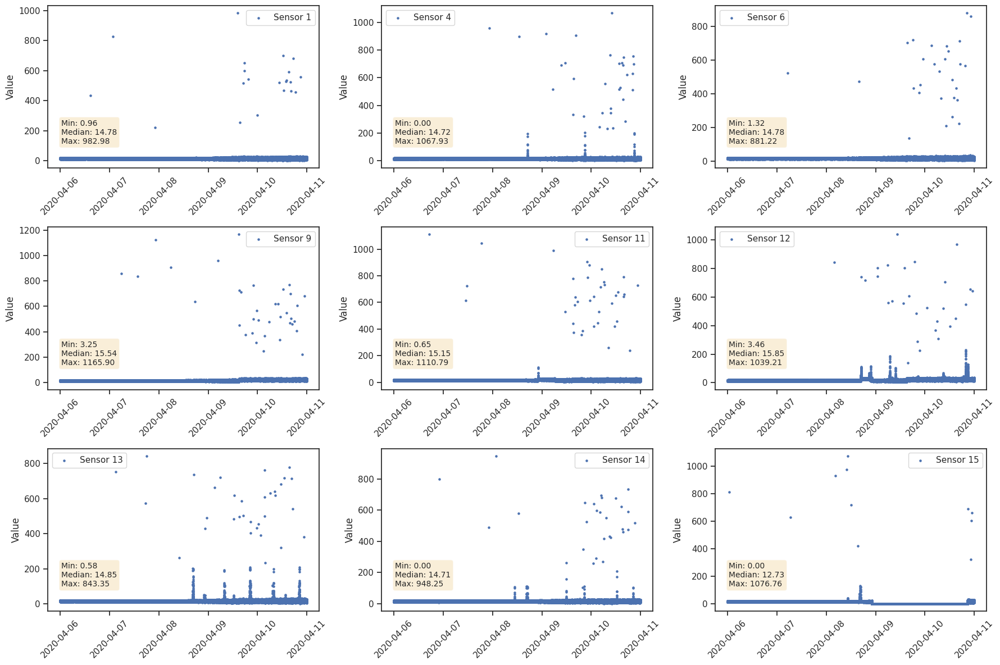

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(staSensorMapDF['Sensor-id'].unique())

nrows = (len(sensor_ids) + 1) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = staSensorMapDF[staSensorMapDF['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

Date
2020-04-06    155520
2020-04-07    155520
2020-04-08    155520
2020-04-09    155520
2020-04-10    155502
Name: count, dtype: int64


Text(0, 0.5, 'Counts')

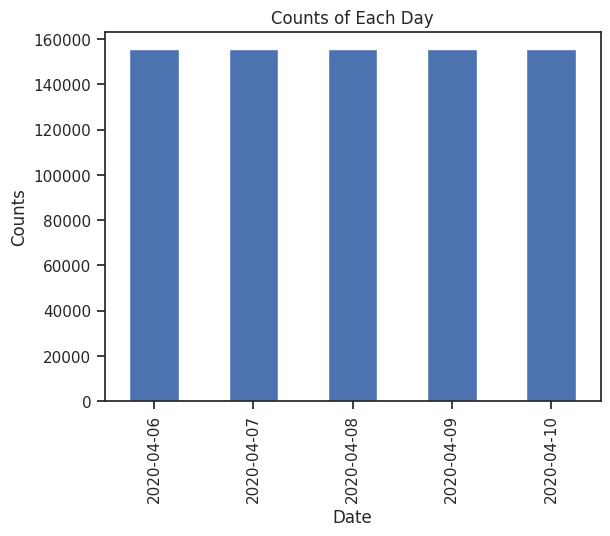

In [ ]:
day_counts = staSensorMapDF['Date'].value_counts()

print(day_counts)

day_counts.plot(kind='bar')

plt.title('Counts of Each Day')
plt.xlabel('Date')
plt.ylabel('Counts')

Sensor-id
12    86398
13    86398
11    86398
6     86398
1     86398
9     86398
14    86398
4     86398
15    86398
Name: count, dtype: int64


Text(0, 0.5, 'Counts')

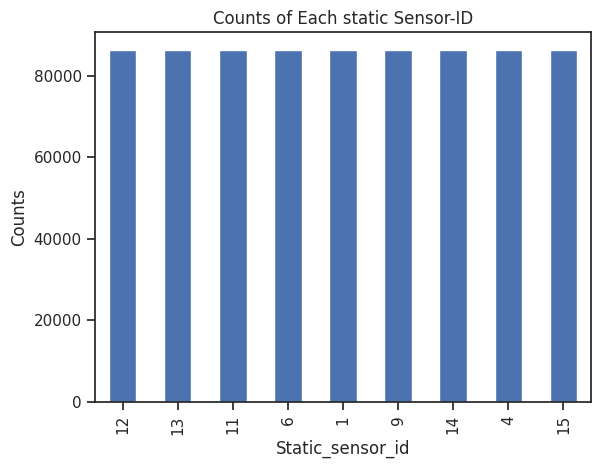

In [ ]:
sensor_counts = staSensorMapDF['Sensor-id'].value_counts()

print(sensor_counts)

sensor_counts.plot(kind='bar')

plt.title('Counts of Each static Sensor-ID')
plt.xlabel('Static_sensor_id')
plt.ylabel('Counts')

In [ ]:
print(staSensorMapDF.columns)

Index(['Sensor-id', 'Lat', 'Long', 'Location', 'Timestamp', 'Value', 'Units',
       'Date', 'Hour', 'Minute', 'Duration', 'Duration_from_start'],
      dtype='object')


In [ ]:
# make sure the type of 'Timstamp"
staSensorMapDF['Timestamp'] = pd.to_datetime(staSensorMapDF['Timestamp'])

# Set Timestamp as index
staSensorMapDF.set_index('Timestamp', inplace=True)

# group by hour and sensor-id, calculate the average value
hourly_avg = staSensorMapDF.groupby([pd.Grouper(freq='h'), 'Sensor-id'])['Value'].mean().reset_index()
hourly_avg

# rename
# hourly_avg.rename(columns={'Timestamp': 'Hour', 'Value': 'Average_Value'}, inplace=True)


,Timestamp,Sensor-id,Value
0,2020-04-06 00:00:00,1,14.671871
1,2020-04-06 00:00:00,4,14.531653
2,2020-04-06 00:00:00,6,14.751204
3,2020-04-06 00:00:00,9,14.514592
4,2020-04-06 00:00:00,11,14.623685
...,...,...,...
1075,2020-04-10 23:00:00,11,16.699089
1076,2020-04-10 23:00:00,12,22.952312
1077,2020-04-10 23:00:00,13,16.335181
1078,2020-04-10 23:00:00,14,15.729708


In [ ]:
# Merge static Location and static readings
hourly_avg_location = pd.merge(staLocation, hourly_avg, on='Sensor-id', how='inner')
hourly_avg_location

,Sensor-id,Lat,Long,Location,Timestamp,Value
0,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:00,14.593869
1,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 01:00:00,14.530050
2,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 02:00:00,14.681879
3,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 03:00:00,14.609936
4,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 04:00:00,14.534517
...,...,...,...,...,...,...
1075,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 19:00:00,15.855904
1076,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 20:00:00,20.801207
1077,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 21:00:00,15.920587
1078,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 22:00:00,15.799989


In [ ]:
hourly_avg_location.dtypes

,0
Sensor-id,int64
Lat,float64
Long,float64
Location,object
Timestamp,datetime64[ns]
Value,float64


In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import base64
from PIL import Image

# load picture
with open('/content/drive/My Drive/data/StHimarkNeighborhoodMap.png', 'rb') as image_file:
    encoded_image = base64.b64encode(image_file.read()).decode()

# Define the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Prepare the data
hourly_avg_location['Timestamp'] = pd.to_datetime(hourly_avg_location['Timestamp'])
data_sorted = hourly_avg_location.sort_values(by='Timestamp')

# use unique color for each sensor
sensor_ids = hourly_avg_location['Sensor-id'].unique()
colors = px.colors.qualitative.T10  # use Plotly color set
color_map = {sensor_id: colors[i % len(colors)] for i, sensor_id in enumerate(sensor_ids)}

# add color to dataFrame
hourly_avg_location['Color'] = hourly_avg_location['Sensor-id'].map(color_map)

# Create the figure
fig = go.Figure()

# Add the static map image
fig.add_layout_image(
    dict(
        source=f'data:image/png;base64,{encoded_image}',
        x=lon_min,
        y=lat_max,
        sizex=lon_max - lon_min,
        sizey=lat_max - lat_min,
        xref="x",
        yref="y",
        xanchor="left",
        yanchor="top",
        layer="below"
    )
)

# Create frames for each time step
frames = [
    go.Frame(
        data=[
            go.Scatter(
                x=hourly_avg_location[hourly_avg_location['Timestamp'] == timestamp]['Long'],
                y=hourly_avg_location[hourly_avg_location['Timestamp'] == timestamp]['Lat'],
                mode='markers+text',
                text=hourly_avg_location[hourly_avg_location['Timestamp'] == timestamp]['Sensor-id'],
                textposition='top center',
                marker=dict(
                    size=hourly_avg_location[hourly_avg_location['Timestamp'] == timestamp]['Value']*5,  # Adjust size based on 'Value'
                    color=hourly_avg_location[hourly_avg_location['Timestamp'] == timestamp]['Color'],
                    line=dict(color='black', width=0.5)  # optional: add border for better visibility
                ),
                hovertext=hourly_avg_location[hourly_avg_location['Timestamp'] == timestamp]['Sensor-id'],
                hoverinfo='text+x+y',
                showlegend=False
            )
        ],
        name=str(timestamp)
    )
    for timestamp in hourly_avg_location['Timestamp'].unique()
]

# Add the frames to the figure
fig.frames = frames

# Add the initial trace
fig.add_trace(
    go.Scatter(
        x=hourly_avg_location['Long'],
        y=hourly_avg_location['Lat'],
        mode='markers+text',
        text=hourly_avg_location['Sensor-id'],
        textposition='top center',
        marker=dict(
            size=hourly_avg_location['Value']*2,
            color=hourly_avg_location['Color'],
            line=dict(color='black', width=0.5)  # optional: add border for better visibility
        ),
        hovertext=hourly_avg_location['Sensor-id'],
        hoverinfo='text+x+y',
        showlegend=False
    )
)

# Update the layout with animation settings
fig.update_layout(

    title='Sensor Values Over Time with Static Map Background hourly',
    xaxis=dict(
        range=[lon_min, lon_max],
        title='Longitude',
        zeroline=False,
        showgrid=False,
        scaleanchor='y',
        scaleratio=1
    ),
    yaxis=dict(
        range=[lat_min, lat_max],
        title='Latitude',
        zeroline=False,
        showgrid=False,
        scaleanchor='x',
        scaleratio=1
    ),
    updatemenus=[
        {
            'buttons': [
                {
                    'args': [None, {'frame': {'duration': 1000, 'redraw': True}, 'fromcurrent': True}],
                    'label': 'Play',
                    'method': 'animate',
                },
                {
                    'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
                    'label': 'Pause',
                    'method': 'animate',
                }
            ],
            'direction': 'left',
            'pad': {'r': 10, 't': 50},
            'showactive': True,
            'type': 'buttons',
            'x': 0.1,
            'xanchor': 'right',
            'y': 0,
            'yanchor': 'top'
        }
    ],
    sliders=[{
        'steps': [
            {
                'label': str(timestamp),
                'method': 'animate',
                'args': [[str(timestamp)], {'mode': 'immediate', 'frame': {'duration': 500, 'redraw': True}, 'transition': {'duration': 300}}],
            }
            for timestamp in hourly_avg_location['Timestamp'].unique()
        ],
        'currentvalue': {'prefix': 'Timestamp: '}
    }]
)

# Save the figure to an HTML file
fig.write_html('staice sensor hourly change.html')
fig.show()

In [ ]:
staSensorMapDF = staticDF.copy()
staSensorMapDF

,Sensor-id,Lat,Long,Location,Timestamp,Value,Units,Date,Hour,Minute,Duration,Duration_from_start
0,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:00,16.787,cpm,2020-04-06,0,0,0.0,0.0
1,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:05,13.800,cpm,2020-04-06,0,0,0.0,0.0
2,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:10,14.037,cpm,2020-04-06,0,0,0.0,0.0
3,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:15,14.051,cpm,2020-04-06,0,0,0.0,0.0
4,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:20,14.401,cpm,2020-04-06,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
743995,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:25,14.979,cpm,2020-04-10,23,59,1439.0,7199.0
743996,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:30,13.748,cpm,2020-04-10,23,59,1439.0,7199.0
743997,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:35,15.185,cpm,2020-04-10,23,59,1439.0,7199.0
743998,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:59:40,15.469,cpm,2020-04-10,23,59,1439.0,7199.0


In [ ]:

# make sure column Timestamp is datetime type
staSensorMapDF['Timestamp'] = pd.to_datetime(staSensorMapDF['Timestamp'])

# set column Timestamp as index
staSensorMapDF.set_index('Timestamp', inplace=True)

# group by 10 minute and Sensor-id，calculate the average value of each group
minute_10_avg = staSensorMapDF.groupby([pd.Grouper(freq='10 min'), 'Sensor-id'])['Value'].mean().reset_index()
minute_10_avg


,Timestamp,Sensor-id,Value
0,2020-04-06 00:00:00,1,14.693508
1,2020-04-06 00:00:00,4,14.464808
2,2020-04-06 00:00:00,6,14.868825
3,2020-04-06 00:00:00,9,14.685742
4,2020-04-06 00:00:00,11,14.876592
...,...,...,...
6196,2020-04-10 23:50:00,11,16.636822
6197,2020-04-10 23:50:00,12,23.334373
6198,2020-04-10 23:50:00,13,15.439763
6199,2020-04-10 23:50:00,14,15.313568


In [ ]:
# Merge static Location and static readings
minute_10_avg_location = pd.merge(staLocation, minute_10_avg, on='Sensor-id', how='inner')
minute_10_avg_location

,Sensor-id,Lat,Long,Location,Timestamp,Value
0,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:00:00,14.548383
1,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:10:00,14.455158
2,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:20:00,14.696958
3,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:30:00,14.537575
4,12,0.20764,-119.81556,POINT (-119.81556 0.20764),2020-04-06 00:40:00,14.487108
...,...,...,...,...,...,...
6196,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:10:00,15.486600
6197,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:20:00,15.852283
6198,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:30:00,15.754517
6199,4,0.15109,-119.90952,POINT (-119.90952 0.15109),2020-04-10 23:40:00,15.626375


In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import base64
from PIL import Image

# load picture and converted into Base64 code
with open('/content/drive/My Drive/data/StHimarkNeighborhoodMap.png', 'rb') as image_file:
    encoded_image = base64.b64encode(image_file.read()).decode()

# Define the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Prepare the data
minute_10_avg_location['Timestamp'] = pd.to_datetime(minute_10_avg_location['Timestamp'])
data_sorted = minute_10_avg_location.sort_values(by='Timestamp')

# assign an unique color for each sensor
sensor_ids = minute_10_avg_location['Sensor-id'].unique()
colors = px.colors.qualitative.T10  # use Plotly color set
color_map = {sensor_id: colors[i % len(colors)] for i, sensor_id in enumerate(sensor_ids)}

# add color to DataFrame
minute_10_avg_location['Color'] = minute_10_avg_location['Sensor-id'].map(color_map)

# Create the figure
fig = go.Figure()

# Add the static map image
fig.add_layout_image(
    dict(
        source=f'data:image/png;base64,{encoded_image}',
        x=lon_min,
        y=lat_max,
        sizex=lon_max - lon_min,
        sizey=lat_max - lat_min,
        xref="x",
        yref="y",
        xanchor="left",
        yanchor="top",
        layer="below"
    )
)

# Create frames for each time step
frames = [
    go.Frame(
        data=[
            go.Scatter(
                x=minute_10_avg_location[minute_10_avg_location['Timestamp'] == timestamp]['Long'],
                y=minute_10_avg_location[minute_10_avg_location['Timestamp'] == timestamp]['Lat'],
                mode='markers+text',
                text=minute_10_avg_location[minute_10_avg_location['Timestamp'] == timestamp]['Sensor-id'],
                textposition='top center',
                marker=dict(
                    size=minute_10_avg_location[minute_10_avg_location['Timestamp'] == timestamp]['Value']*3,  # Adjust size based on 'Value'
                    color=minute_10_avg_location[minute_10_avg_location['Timestamp'] == timestamp]['Color'],
                    line=dict(color='black', width=0.5)  # optional: add border for better visibility
                ),
                hovertext=minute_10_avg_location[minute_10_avg_location['Timestamp'] == timestamp]['Sensor-id'],
                hoverinfo='text+x+y',
                showlegend=False
            )
        ],
        name=str(timestamp)
    )
    for timestamp in minute_10_avg_location['Timestamp'].unique()
]

# Add the frames to the figure
fig.frames = frames

# Add the initial trace
fig.add_trace(
    go.Scatter(
        x=minute_10_avg_location['Long'],
        y=minute_10_avg_location['Lat'],
        mode='markers+text',
        text=minute_10_avg_location['Sensor-id'],
        textposition='top center',
        marker=dict(
            size=minute_10_avg_location['Value']*2,
            color=minute_10_avg_location['Color'],
            line=dict(color='black', width=0.5)  # optional: add border for better visibility
        ),
        hovertext=minute_10_avg_location['Sensor-id'],
        hoverinfo='text+x+y',
        showlegend=False
    )
)

# Update the layout with animation settings
fig.update_layout(

    title='Sensor Values Over Time with Static Map Background every 10 mintutes',
    xaxis=dict(
        range=[lon_min, lon_max],
        title='Longitude',
        zeroline=False,
        showgrid=False,
        scaleanchor='y',
        scaleratio=1
    ),
    yaxis=dict(
        range=[lat_min, lat_max],
        title='Latitude',
        zeroline=False,
        showgrid=False,
        scaleanchor='x',
        scaleratio=1
    ),
    updatemenus=[
        {
            'buttons': [
                {
                    'args': [None, {'frame': {'duration': 1000, 'redraw': True}, 'fromcurrent': True}],
                    'label': 'Play',
                    'method': 'animate',
                },
                {
                    'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
                    'label': 'Pause',
                    'method': 'animate',
                }
            ],
            'direction': 'left',
            'pad': {'r': 10, 't': 50},
            'showactive': True,
            'type': 'buttons',
            'x': 0.1,
            'xanchor': 'right',
            'y': 0,
            'yanchor': 'top'
        }
    ],
    sliders=[{
        'steps': [
            {
                'label': str(timestamp),
                'method': 'animate',
                'args': [[str(timestamp)], {'mode': 'immediate', 'frame': {'duration': 500, 'redraw': True}, 'transition': {'duration': 300}}],
            }
            for timestamp in hourly_avg_location['Timestamp'].unique()
        ],
        'currentvalue': {'prefix': 'Timestamp: '}
    }]
)

# Save the figure to an HTML file
fig.write_html('Static sensor change every 10 minutes.html')
fig.show()

## load mobile data

In [3]:
mobileDF = pd.read_csv('/content/drive/My Drive/data/MobileSensorReadings.csv')

In [ ]:
mobileDF

,Timestamp,Sensor-id,Long,Lat,Value,Units,User-id
0,2020-04-06 00:00:00,15,-119.830350,0.140070,0.000000,cpm,CitizenScientist
1,2020-04-06 00:00:00,22,-119.760750,0.042050,0.000000,cpm,HSS
2,2020-04-06 00:00:00,40,-119.890670,0.116580,0.000000,cpm,MutantX
3,2020-04-06 00:00:00,1,-119.966650,0.187920,0.000000,cpm,MySensor
4,2020-04-06 00:00:00,27,-119.805700,0.017110,0.000000,cpm,CitizenScientist
...,...,...,...,...,...,...,...
3315706,2020-04-10 23:59:45,44,-119.890380,0.166068,42.280195,cpm,TaxiDriver
3315707,2020-04-10 23:59:45,8,-119.837600,0.175669,16.628476,cpm,MySensor
3315708,2020-04-10 23:59:45,41,-119.883546,0.121761,32.440810,cpm,CitizenScientist
3315709,2020-04-10 23:59:45,14,-119.841615,0.138788,21.707422,cpm,AS-3


In [ ]:
# Check the number of sensors
unique_sensor_ids = mobileDF['Sensor-id'].unique()
unique_sensor_ids.sort()
print(unique_sensor_ids)
print(len(unique_sensor_ids))

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50]
50


In [ ]:
# Check whether user-ids matches sensor-id or not
unique_user_ids = mobileDF[' User-id'].unique()

print(unique_user_ids)
print(len(unique_user_ids))

[' CitizenScientist' ' HSS' ' MutantX' ' MySensor' ' PeterLovesCrystals54'
 ' Bob' ' TestUnit' ' RadCurieous' ' TaxiDriver' ' AS-3' ' RichardFox'
 ' XrayLady' ' GermanWrinkler43' ' HiMarkHS' ' ASWillhiem' ' UncleG'
 ' AS-2' ' ProfessorSievert' ' Ckimball' ' AS-1'
 ' NeutronsAreFreeOfCharge' ' AlwaysGlowing']
22


In [4]:
mobileDF['Location'] = mobileDF.apply(lambda row: Point((row['Long'], row['Lat'])), axis=1)

Sensor-id
35    86398
26    86398
1     86267
38    85321
19    85293
4     84313
31    84088
13    84055
40    84044
33    83540
41    83326
39    82841
37    82596
47    81927
44    81835
16    81645
43    81432
42    80735
17    79850
23    78466
3     78405
50    78200
32    76672
15    76239
2     70160
20    67702
27    60326
36    60174
25    58414
24    58245
30    57733
45    56616
28    56607
22    56558
46    55433
11    55332
12    54710
10    54041
7     53925
21    53811
14    51622
8     51234
29    49809
9     48355
5     48073
34    40752
49    35629
48    32061
6     31259
18    23244
Name: count, dtype: int64


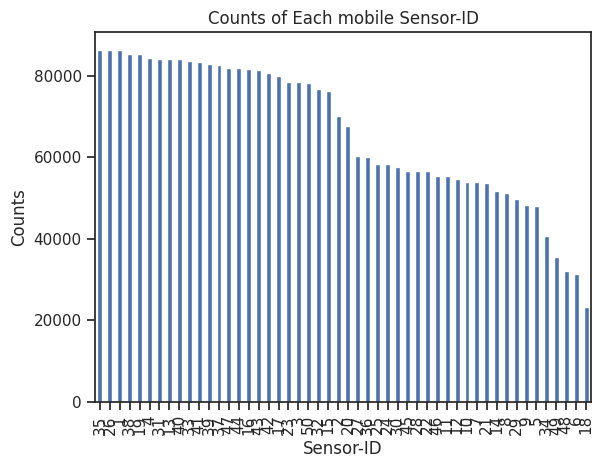

In [ ]:
sensor_counts = mobileDF['Sensor-id'].value_counts()

print(sensor_counts)

sensor_counts.plot(kind='bar')

plt.title('Counts of Each mobile Sensor-ID')
plt.xlabel('Sensor-ID')
plt.ylabel('Counts')

plt.show()

In [ ]:
print(mobileDF.isnull().sum())

Timestamp    0
Sensor-id    0
Long         0
Lat          0
Value        0
Units        0
 User-id     0
Location     0
dtype: int64


In [ ]:
unique_location = mobileDF['Location'].unique()

print(len(unique_location))

197052


In [ ]:
mobileDF.columns

Index(['Timestamp', 'Sensor-id', 'Long', 'Lat', 'Value', 'Units', ' User-id',
       'Location'],
      dtype='object')

In [5]:
unique_location_sensor = mobileDF[['Location', 'Sensor-id']].drop_duplicates()

print(len(unique_location_sensor))

201675


In [ ]:
unique_location_sensor

,Location,Sensor-id
0,POINT (-119.83035 0.14007),15
1,POINT (-119.76075 0.04205),22
2,POINT (-119.89067 0.11658),40
3,POINT (-119.96665 0.18792),1
4,POINT (-119.8057 0.01711),27
...,...,...
3315662,POINT (-119.8376 0.175598),8
3315668,POINT (-119.80918 0.15817),9
3315680,POINT (-119.80918 0.157901),9
3315699,POINT (-119.87551 0.187255),5


In [ ]:
unique_location_sensor.dtypes

,0
Location,object
Sensor-id,int64


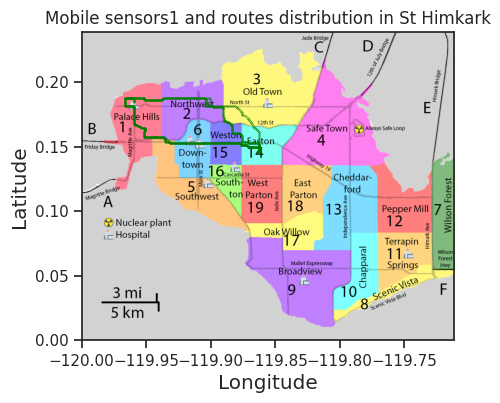

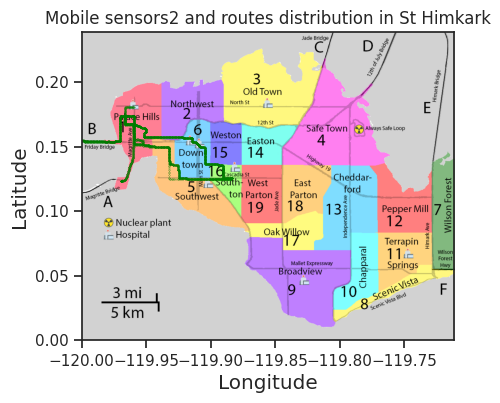

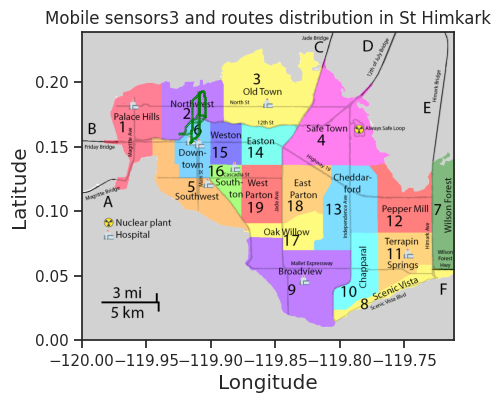

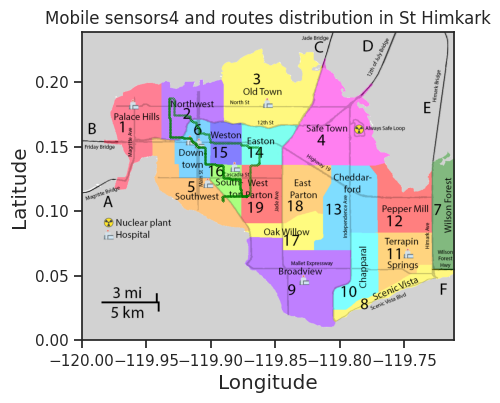

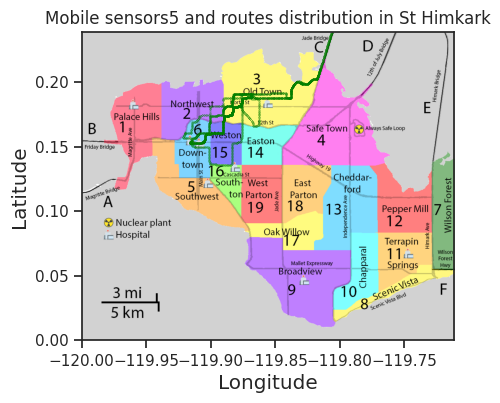

...

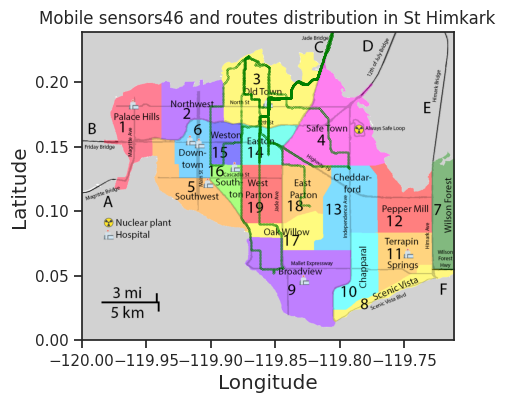

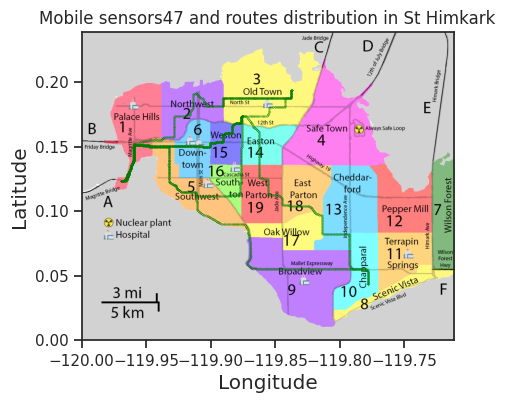

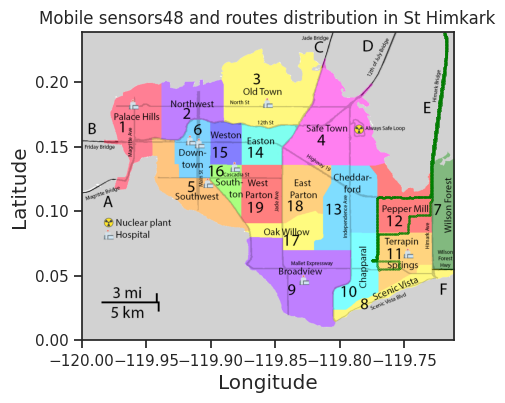

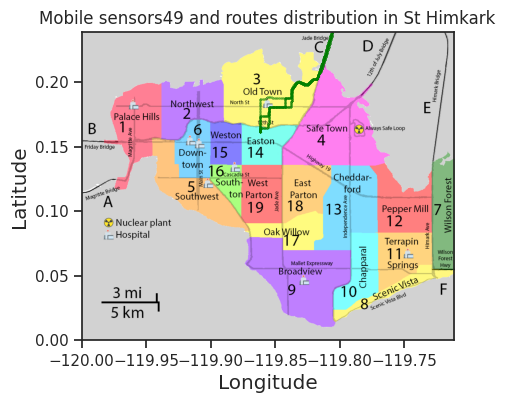

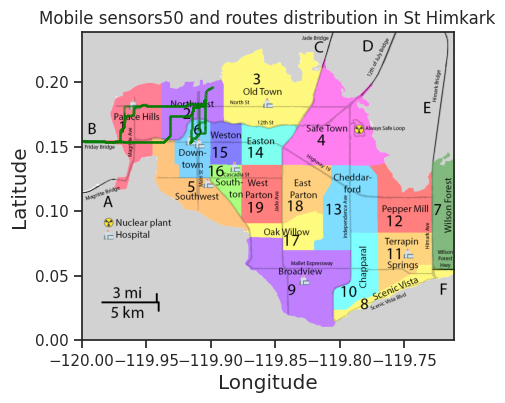

In [ ]:
# check the route for each sensors
# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkLabeledMap.png')

# defin the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

for sensor in unique_sensor_ids:
   # Create a GeoDataFrame with the data points
  gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
  gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])
  gdf_mobile = gpd.GeoDataFrame(unique_location_sensor[unique_location_sensor['Sensor-id'] == sensor], geometry='Location')


  # Set the figure size (width, height) in inches
  fig, ax = plt.subplots(figsize=(6, 4))

  # Plot the map image
  img_extent = [lon_min, lon_max, lat_min, lat_max]
  ax.imshow(map_image, extent=img_extent, aspect='auto')

  # Plot the GeoDataFrame
  #gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
  gdf_mobile.plot(ax=ax, color='green', marker='o', markersize=0.01, label='Mobile Sensors')
  #gdf_nuclear_plant.plot(ax=ax, color = 'magenta', marker = '^', markersize=300, label='Nuclear plant')

  # # Annotate static sensors
  # for idx, row in gdf_static_sensors.iterrows():
  #     ax.annotate(row['Sensor-id'],
  #                 (row['Location'].x, row['Location'].y),
  #                 textcoords="offset points",
  #                 xytext=(0, 10),
  #                 ha='center', fontsize=12,
  #                 color='green')

  # Add labels or other annotations as needed
  ax.set_title(f'Mobile sensors{sensor} and routes distribution in St Himkark')
  plt.xlabel('Longitude', fontsize='large')
  plt.ylabel('Latitude', fontsize='large')
  #plt.legend(loc='lower left', fontsize='xx-small', bbox_to_anchor=(0.05, 0.05))

  # Display the plot
  plt.show()

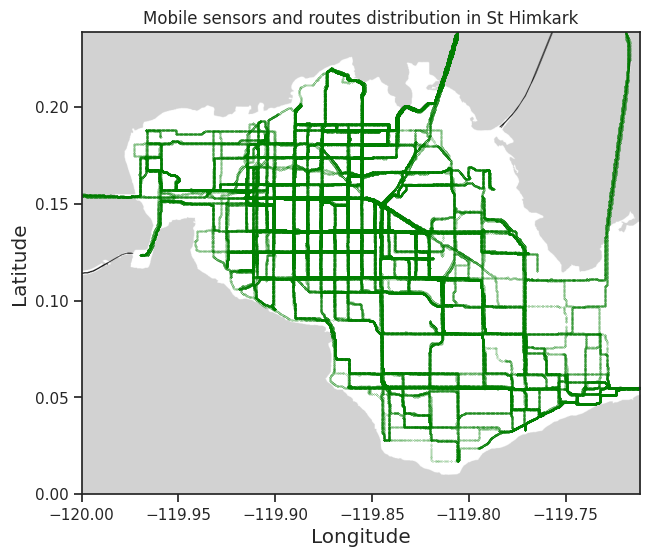

In [6]:
# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# defin the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]


  # Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])
gdf_mobile = gpd.GeoDataFrame(unique_location_sensor, geometry='Location')


# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(9, 6))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot the GeoDataFrame
#gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_mobile.plot(ax=ax, color='green', marker='o', markersize=0.01, label='Mobile Sensors')
#gdf_nuclear_plant.plot(ax=ax, color = 'magenta', marker = '^', markersize=300, label='Nuclear plant')

# # Annotate static sensors
# for idx, row in gdf_static_sensors.iterrows():
#     ax.annotate(row['Sensor-id'],
#                 (row['Location'].x, row['Location'].y),
#                 textcoords="offset points",
#                 xytext=(0, 10),
#                 ha='center', fontsize=12,
#                 color='green')

# Add labels or other annotations as needed
ax.set_title('Mobile sensors and routes distribution in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
#plt.legend(loc='lower left', fontsize='xx-small', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()

In [ ]:
zeroValueDF = mobileDF[mobileDF['Value'] == 0]

In [ ]:
zeroValueDF

,Timestamp,Sensor-id,Long,Lat,Value,Units,User-id,Location
0,2020-04-06 00:00:00,15,-119.830350,0.140070,0.0,cpm,CitizenScientist,POINT (-119.83035 0.14007)
1,2020-04-06 00:00:00,22,-119.760750,0.042050,0.0,cpm,HSS,POINT (-119.76075 0.04205)
2,2020-04-06 00:00:00,40,-119.890670,0.116580,0.0,cpm,MutantX,POINT (-119.89067 0.11658)
3,2020-04-06 00:00:00,1,-119.966650,0.187920,0.0,cpm,MySensor,POINT (-119.96665 0.18792)
4,2020-04-06 00:00:00,27,-119.805700,0.017110,0.0,cpm,CitizenScientist,POINT (-119.8057 0.01711)
...,...,...,...,...,...,...,...,...
3314350,2020-04-10 23:56:10,13,-119.841773,0.145333,0.0,cpm,HSS,POINT (-119.841773 0.145333)
3315062,2020-04-10 23:58:05,16,-119.900281,0.095533,0.0,cpm,CitizenScientist,POINT (-119.900281 0.095533)
3315105,2020-04-10 23:58:10,37,-119.896902,0.153410,0.0,cpm,Bob,POINT (-119.896902 0.15341)
3315174,2020-04-10 23:58:20,13,-119.841773,0.145333,0.0,cpm,HSS,POINT (-119.841773 0.145333)


In [ ]:
unique_sensor = zeroValueDF['Sensor-id'].unique()
unique_sensor.sort()
print(unique_sensor)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50]


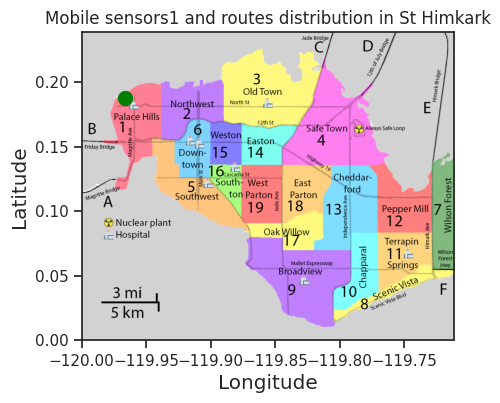

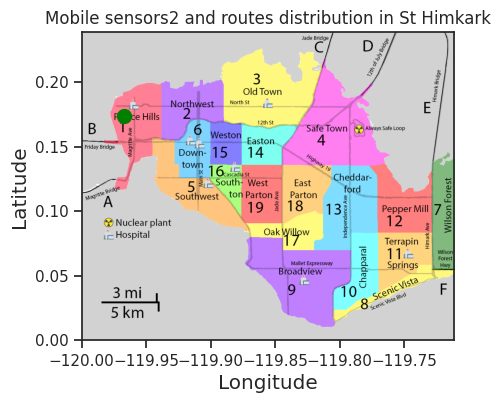

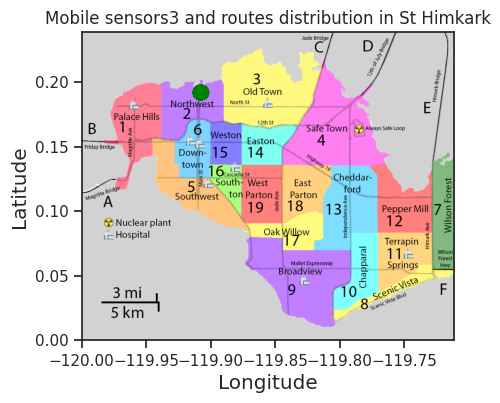

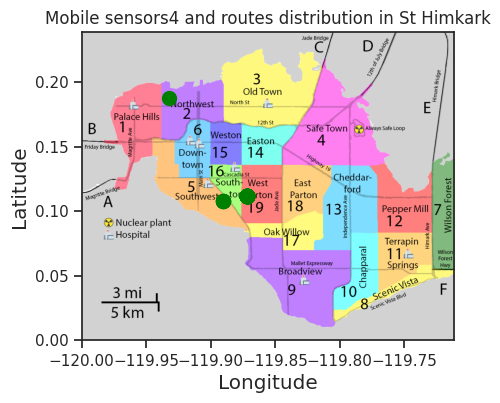

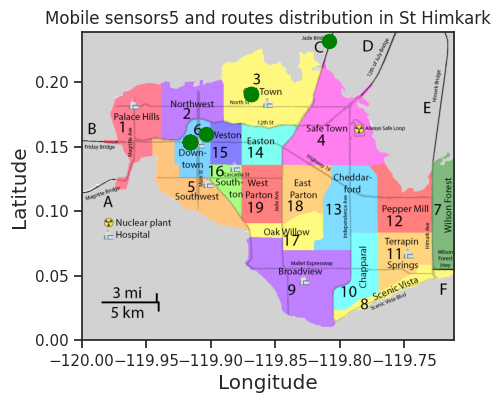

...

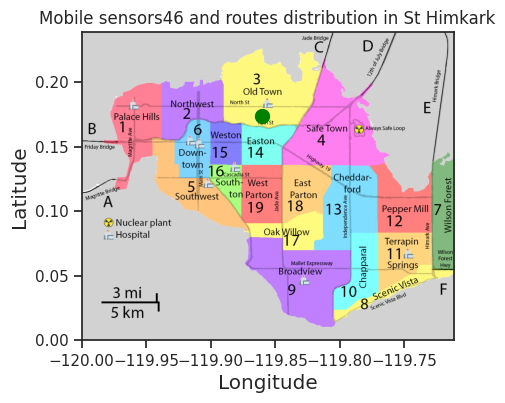

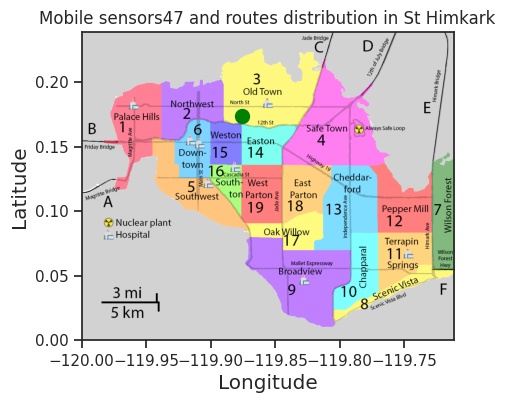

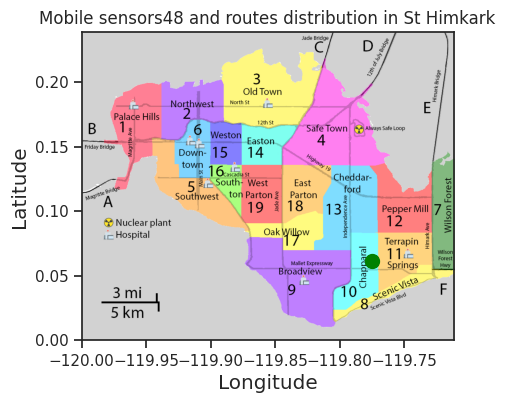

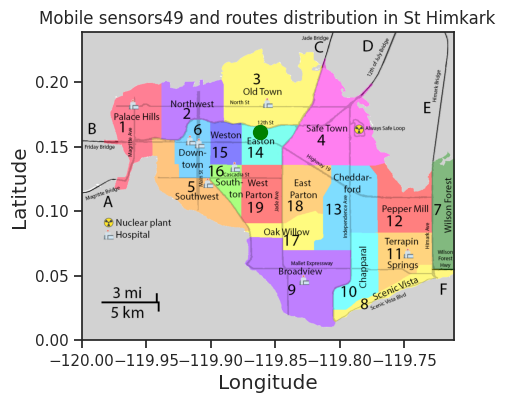

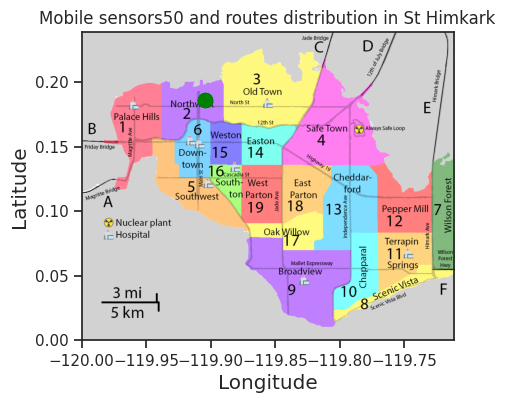

In [ ]:
unique_sensor = zeroValueDF['Sensor-id'].unique()
unique_sensor.sort()


# check the route for each sensors
# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkLabeledMap.png')

# defin the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

for sensor in unique_sensor:
   # Create a GeoDataFrame with the data points
  gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
  gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])
  gdf_mobile = gpd.GeoDataFrame(zeroValueDF[zeroValueDF['Sensor-id'] == sensor], geometry='Location')


  # Set the figure size (width, height) in inches
  fig, ax = plt.subplots(figsize=(6, 4))

  # Plot the map image
  img_extent = [lon_min, lon_max, lat_min, lat_max]
  ax.imshow(map_image, extent=img_extent, aspect='auto')

  # Plot the GeoDataFrame
  #gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
  gdf_mobile.plot(ax=ax, color='green', marker='o', markersize=100, label='Mobile Sensors')
  #gdf_nuclear_plant.plot(ax=ax, color = 'magenta', marker = '^', markersize=300, label='Nuclear plant')

  # # Annotate static sensors
  # for idx, row in gdf_static_sensors.iterrows():
  #     ax.annotate(row['Sensor-id'],
  #                 (row['Location'].x, row['Location'].y),
  #                 textcoords="offset points",
  #                 xytext=(0, 10),
  #                 ha='center', fontsize=12,
  #                 color='green')

  # Add labels or other annotations as needed
  ax.set_title(f'Mobile sensors{sensor} and routes distribution in St Himkark')
  plt.xlabel('Longitude', fontsize='large')
  plt.ylabel('Latitude', fontsize='large')
  #plt.legend(loc='lower left', fontsize='xx-small', bbox_to_anchor=(0.05, 0.05))

  # Display the plot
  plt.show()

In [ ]:
mobileDF_remove_zero = mobileDF[mobileDF['Value'] != 0].copy()

In [ ]:
mobileDF_remove_zero['Timestamp'] = pd.to_datetime(mobileDF_remove_zero['Timestamp'], format='%Y-%m-%d %H:%M:%S')

In [ ]:
print(mobileDF_remove_zero.dtypes)

Timestamp    datetime64[ns]
Sensor-id             int64
Long                float64
Lat                 float64
Value               float64
Units                object
 User-id             object
Location             object
dtype: object


In [ ]:
mobileDF_remove_zero

,Timestamp,Sensor-id,Long,Lat,Value,Units,User-id,Location
50,2020-04-06 00:00:05,41,-119.883420,0.121800,33.000000,cpm,CitizenScientist,POINT (-119.88342 0.1218)
51,2020-04-06 00:00:05,27,-119.805700,0.017110,16.000000,cpm,CitizenScientist,POINT (-119.8057 0.01711)
52,2020-04-06 00:00:05,45,-119.831220,0.062350,40.000000,cpm,CitizenScientist,POINT (-119.83122 0.06235)
53,2020-04-06 00:00:05,17,-119.925180,0.117450,27.000000,cpm,HiMarkHS,POINT (-119.92518 0.11745)
55,2020-04-06 00:00:05,28,-119.770900,0.044370,15.000000,cpm,AS-1,POINT (-119.7709 0.04437)
...,...,...,...,...,...,...,...,...
3315706,2020-04-10 23:59:45,44,-119.890380,0.166068,42.280195,cpm,TaxiDriver,POINT (-119.89038 0.166068)
3315707,2020-04-10 23:59:45,8,-119.837600,0.175669,16.628476,cpm,MySensor,POINT (-119.8376 0.175669)
3315708,2020-04-10 23:59:45,41,-119.883546,0.121761,32.440810,cpm,CitizenScientist,POINT (-119.883546 0.121761)
3315709,2020-04-10 23:59:45,14,-119.841615,0.138788,21.707422,cpm,AS-3,POINT (-119.841615 0.138788)


In [ ]:
mobileDF_remove_zero['Date']= mobileDF_remove_zero['Timestamp'].dt.date
mobileDF_remove_zero['Hour'] = mobileDF_remove_zero['Timestamp'].dt.hour
mobileDF_remove_zero['Minute'] = mobileDF_remove_zero['Timestamp'].dt.minute
# Compute duration from start of the day to the current time in minutes
mobileDF_remove_zero['Duration'] = mobileDF_remove_zero['Timestamp'].apply(lambda ts: (ts - ts.replace(hour=0, minute=0, second=0, microsecond=0)).total_seconds() // 60)
# Find the first day in the data
first_day = pd.Timestamp('2020-04-06')

# Compute duration from the first day of data to the current time in minutes
mobileDF_remove_zero['Duration_from_start'] = mobileDF_remove_zero['Timestamp'].apply(lambda ts: (ts - first_day).total_seconds() // 60)

In [ ]:
mobileDF_remove_zero

,Timestamp,Sensor-id,Long,Lat,Value,Units,User-id,Location,Date,Hour,Minute,Duration,Duration_from_start
50,2020-04-06 00:00:05,41,-119.883420,0.121800,33.000000,cpm,CitizenScientist,POINT (-119.88342 0.1218),2020-04-06,0,0,0.0,0.0
51,2020-04-06 00:00:05,27,-119.805700,0.017110,16.000000,cpm,CitizenScientist,POINT (-119.8057 0.01711),2020-04-06,0,0,0.0,0.0
52,2020-04-06 00:00:05,45,-119.831220,0.062350,40.000000,cpm,CitizenScientist,POINT (-119.83122 0.06235),2020-04-06,0,0,0.0,0.0
53,2020-04-06 00:00:05,17,-119.925180,0.117450,27.000000,cpm,HiMarkHS,POINT (-119.92518 0.11745),2020-04-06,0,0,0.0,0.0
55,2020-04-06 00:00:05,28,-119.770900,0.044370,15.000000,cpm,AS-1,POINT (-119.7709 0.04437),2020-04-06,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3315706,2020-04-10 23:59:45,44,-119.890380,0.166068,42.280195,cpm,TaxiDriver,POINT (-119.89038 0.166068),2020-04-10,23,59,1439.0,7199.0
3315707,2020-04-10 23:59:45,8,-119.837600,0.175669,16.628476,cpm,MySensor,POINT (-119.8376 0.175669),2020-04-10,23,59,1439.0,7199.0
3315708,2020-04-10 23:59:45,41,-119.883546,0.121761,32.440810,cpm,CitizenScientist,POINT (-119.883546 0.121761),2020-04-10,23,59,1439.0,7199.0
3315709,2020-04-10 23:59:45,14,-119.841615,0.138788,21.707422,cpm,AS-3,POINT (-119.841615 0.138788),2020-04-10,23,59,1439.0,7199.0


In [ ]:
# make sure the type of 'Timstamp"
mobileDF_remove_zero['Timestamp'] = pd.to_datetime(mobileDF_remove_zero['Timestamp'])

# Set Timestamp as index
mobileDF_remove_zero.set_index('Timestamp', inplace=True)

mobileDF_remove_zero = gpd.GeoDataFrame(mobileDF_remove_zero, geometry='Location')



In [ ]:
mobileDF_remove_zero

,Sensor-id,Long,Lat,Value,Units,User-id,Location,Date,Hour,Minute,Duration,Duration_from_start
Timestamp,,,,,,,,,,,,
2020-04-06 00:00:05,41,-119.883420,0.121800,33.000000,cpm,CitizenScientist,POINT (-119.88342 0.12180),2020-04-06,0,0,0.0,0.0
2020-04-06 00:00:05,27,-119.805700,0.017110,16.000000,cpm,CitizenScientist,POINT (-119.80570 0.01711),2020-04-06,0,0,0.0,0.0
2020-04-06 00:00:05,45,-119.831220,0.062350,40.000000,cpm,CitizenScientist,POINT (-119.83122 0.06235),2020-04-06,0,0,0.0,0.0
2020-04-06 00:00:05,17,-119.925180,0.117450,27.000000,cpm,HiMarkHS,POINT (-119.92518 0.11745),2020-04-06,0,0,0.0,0.0
2020-04-06 00:00:05,28,-119.770900,0.044370,15.000000,cpm,AS-1,POINT (-119.77090 0.04437),2020-04-06,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-04-10 23:59:45,44,-119.890380,0.166068,42.280195,cpm,TaxiDriver,POINT (-119.89038 0.16607),2020-04-10,23,59,1439.0,7199.0
2020-04-10 23:59:45,8,-119.837600,0.175669,16.628476,cpm,MySensor,POINT (-119.83760 0.17567),2020-04-10,23,59,1439.0,7199.0
2020-04-10 23:59:45,41,-119.883546,0.121761,32.440810,cpm,CitizenScientist,POINT (-119.88355 0.12176),2020-04-10,23,59,1439.0,7199.0


In [ ]:
mobileDF_remove_zero = gpd.GeoDataFrame(mobileDF_remove_zero, geometry='Location')

# Now group by hour, latitude, and longitude for averaging
avg_mobile_per_location = mobileDF_remove_zero.groupby(['Lat', 'Long', 'Location'])['Value'].mean().reset_index()
avg_mobile_per_location


,Lat,Long,Location,Value
0,0.017057,-119.805669,POINT (-119.80567 0.01706),22.400000
1,0.017110,-119.809338,POINT (-119.80934 0.01711),33.351808
2,0.017110,-119.805700,POINT (-119.80570 0.01711),22.928911
3,0.017111,-119.807018,POINT (-119.80702 0.01711),25.505099
4,0.017112,-119.806740,POINT (-119.80674 0.01711),33.598547
...,...,...,...,...
196762,0.238353,-119.718896,POINT (-119.71890 0.23835),41.000000
196763,0.238362,-119.806092,POINT (-119.80609 0.23836),574.060691
196764,0.238366,-119.806101,POINT (-119.80610 0.23837),557.600810
196765,0.238370,-119.805867,POINT (-119.80587 0.23837),45.000000


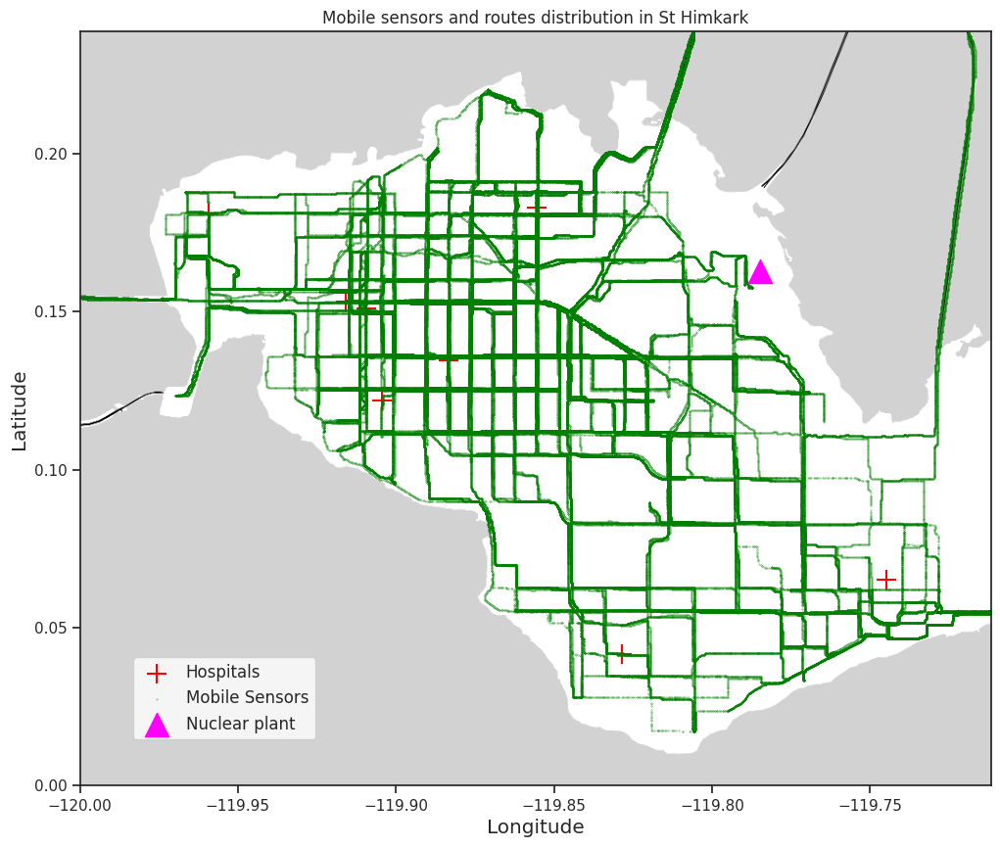

In [ ]:
# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# defin the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_mobile = gpd.GeoDataFrame(avg_mobile_per_location, geometry='Location')
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])

# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot the GeoDataFrame
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_mobile.plot(ax=ax, color='green', marker='o', markersize=0.05, label='Mobile Sensors')
gdf_nuclear_plant.plot(ax=ax, color = 'magenta', marker = '^', markersize=300, label='Nuclear plant')

# # Annotate static sensors
# for idx, row in gdf_static_sensors.iterrows():
#     ax.annotate(row['Sensor-id'],
#                 (row['Location'].x, row['Location'].y),
#                 textcoords="offset points",
#                 xytext=(0, 10),
#                 ha='center', fontsize=12,
#                 color='green')

# Add labels or other annotations as needed
ax.set_title('Mobile sensors and routes distribution in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()

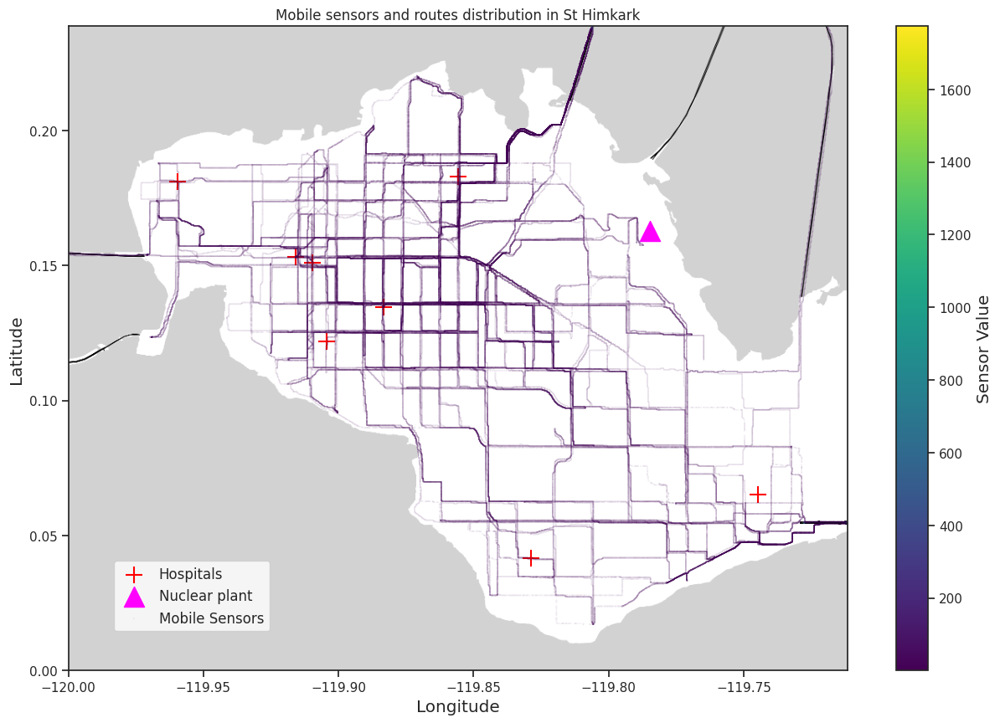

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from PIL import Image
import matplotlib.colors as mcolors

# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# Define the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# Label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_mobile = gpd.GeoDataFrame(avg_mobile_per_location, geometry='Location')
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])

# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot hospitals and nuclear plant
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_nuclear_plant.plot(ax=ax, color='magenta', marker='^', markersize=300, label='Nuclear plant')

# Create a colormap based on the 'Value' column in gdf_mobile
norm = plt.Normalize(vmin=gdf_mobile['Value'].min(), vmax=gdf_mobile['Value'].max())
cmap = plt.cm.viridis  # You can choose other colormaps like 'plasma', 'inferno', etc.
colors = cmap(norm(gdf_mobile['Value']))

# Plot the GeoDataFrame with color based on 'Value'
gdf_mobile.plot(ax=ax, color=colors, marker='o', markersize= 0.001, label='Mobile Sensors')

# Add a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation='vertical')
cbar.set_label('Sensor Value', fontsize='large')

# Add labels or other annotations as needed
ax.set_title('Mobile sensors and routes distribution in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()




5-60 CPM: Normal background radiation. Safe and typical for most environments.
60-100 CPM: Slightly elevated but generally still safe. This could occur in areas with higher natural radiation or in environments where materials like granite are present.
100-300 CPM: Higher than average. May warrant investigation, especially if sustained. This level could occur due to nearby radioactive materials or certain industrial activities.
300+ CPM: Potentially concerning, especially if sustained or increasing. This could indicate contamination or a leak from a radioactive source.



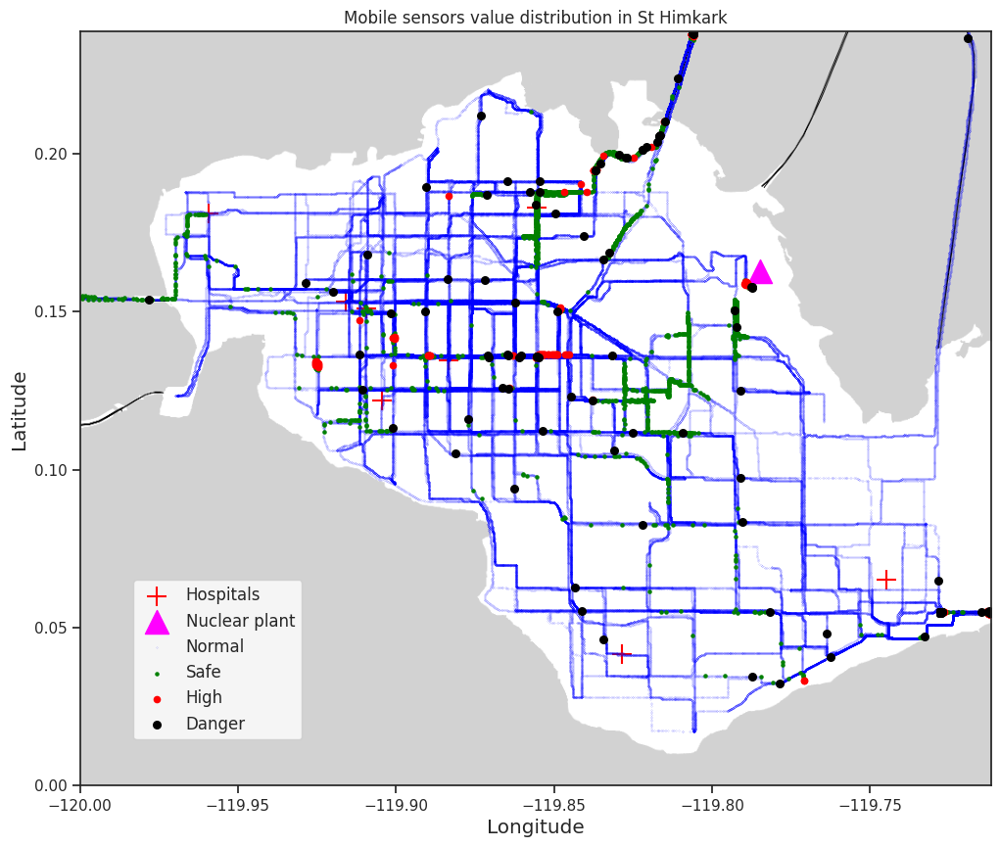

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from PIL import Image
import matplotlib.colors as mcolors

# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# Define the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# Label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_mobile_normal = gpd.GeoDataFrame(avg_mobile_per_location[avg_mobile_per_location['Value'] <= 60],geometry='Location')
gdf_mobile_safe = gpd.GeoDataFrame(avg_mobile_per_location[(avg_mobile_per_location['Value'] > 60) & (avg_mobile_per_location['Value'] <= 100)],geometry='Location')
gdf_mobile_high = gpd.GeoDataFrame(avg_mobile_per_location[(avg_mobile_per_location['Value'] > 100) & (avg_mobile_per_location['Value'] <= 300)],geometry='Location')
gdf_mobile_danger = gpd.GeoDataFrame(avg_mobile_per_location[avg_mobile_per_location['Value'] > 300],geometry='Location')

gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])

# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot hospitals and nuclear plant
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_nuclear_plant.plot(ax=ax, color='magenta', marker='^', markersize=300, label='Nuclear plant')

# Plot the GeoDataFrame with color based on 'Value'
gdf_mobile_normal.plot(ax=ax, color='blue', marker='o', markersize= 0.005, label='Normal')
gdf_mobile_safe.plot(ax=ax, color='green', marker='o', markersize= 5, label='Safe')
gdf_mobile_high.plot(ax=ax, color='red', marker='o', markersize= 20, label='High')
gdf_mobile_danger.plot(ax=ax, color='black', marker='o', markersize= 30, label='Danger')

# Add labels or other annotations as needed
ax.set_title('Mobile sensors value distribution in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()

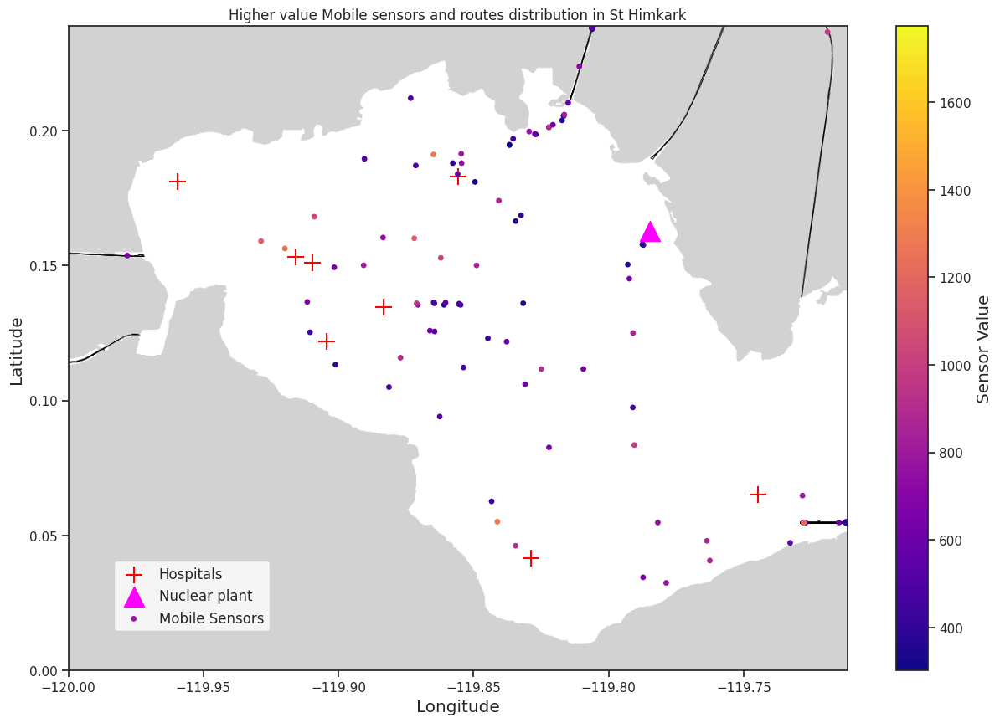

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from PIL import Image
import matplotlib.colors as mcolors

# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# Define the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# Label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_mobile = gpd.GeoDataFrame(avg_mobile_per_location[avg_mobile_per_location['Value'] > 300],geometry='Location')
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])

# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot hospitals and nuclear plant
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_nuclear_plant.plot(ax=ax, color='magenta', marker='^', markersize=300, label='Nuclear plant')

# Create a colormap based on the 'Value' column in gdf_mobile
norm = plt.Normalize(vmin=gdf_mobile['Value'].min(), vmax=gdf_mobile['Value'].max())
cmap = plt.cm.plasma  # You can choose other colormaps like 'plasma', 'inferno', etc.
colors = cmap(norm(gdf_mobile['Value']))

# Plot the GeoDataFrame with color based on 'Value'
gdf_mobile.plot(ax=ax, color=colors, marker='o', markersize= 15, label='Mobile Sensors')

# Add a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation='vertical')
cbar.set_label('Sensor Value', fontsize='large')

# Add labels or other annotations as needed
ax.set_title('Higher value Mobile sensors and routes distribution in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()

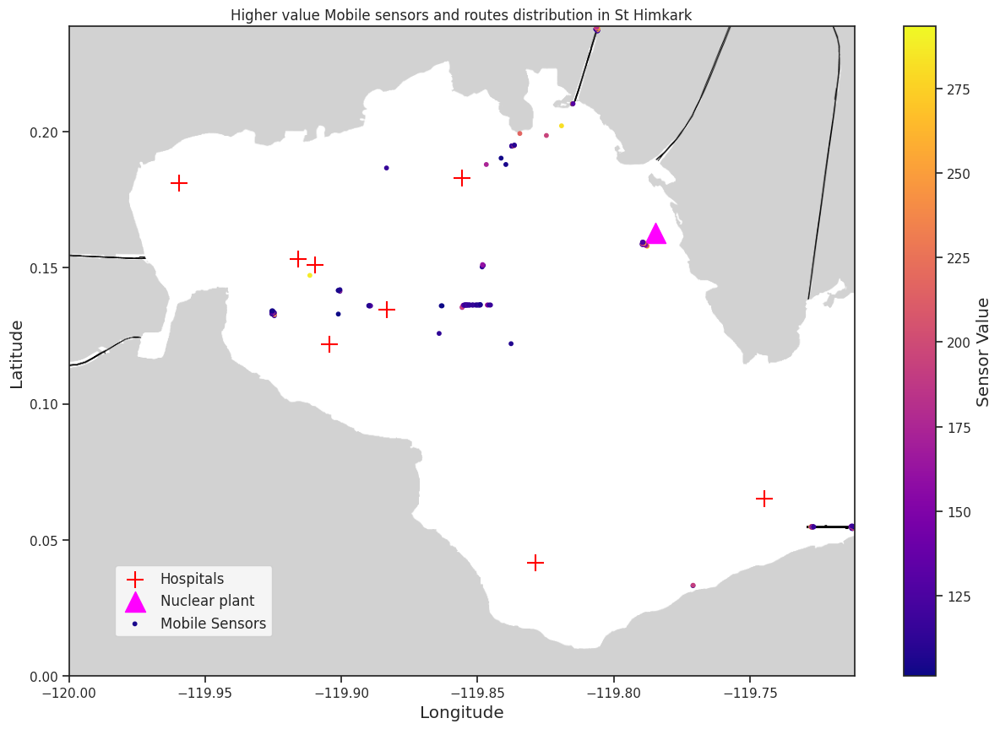

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from PIL import Image
import matplotlib.colors as mcolors

# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# Define the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# Label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_mobile = gpd.GeoDataFrame(avg_mobile_per_location[(avg_mobile_per_location['Value'] > 100) & (avg_mobile_per_location['Value'] <= 300)],geometry='Location')
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])

# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot hospitals and nuclear plant
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_nuclear_plant.plot(ax=ax, color='magenta', marker='^', markersize=300, label='Nuclear plant')

# Create a colormap based on the 'Value' column in gdf_mobile
norm = plt.Normalize(vmin=gdf_mobile['Value'].min(), vmax=gdf_mobile['Value'].max())
cmap = plt.cm.plasma  # You can choose other colormaps like 'plasma', 'inferno', etc.
colors = cmap(norm(gdf_mobile['Value']))

# Plot the GeoDataFrame with color based on 'Value'
gdf_mobile.plot(ax=ax, color=colors, marker='o', markersize= 10, label='Mobile Sensors')

# Add a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation='vertical')
cbar.set_label('Sensor Value', fontsize='large')

# Add labels or other annotations as needed
ax.set_title('Higher value Mobile sensors and routes distribution in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()

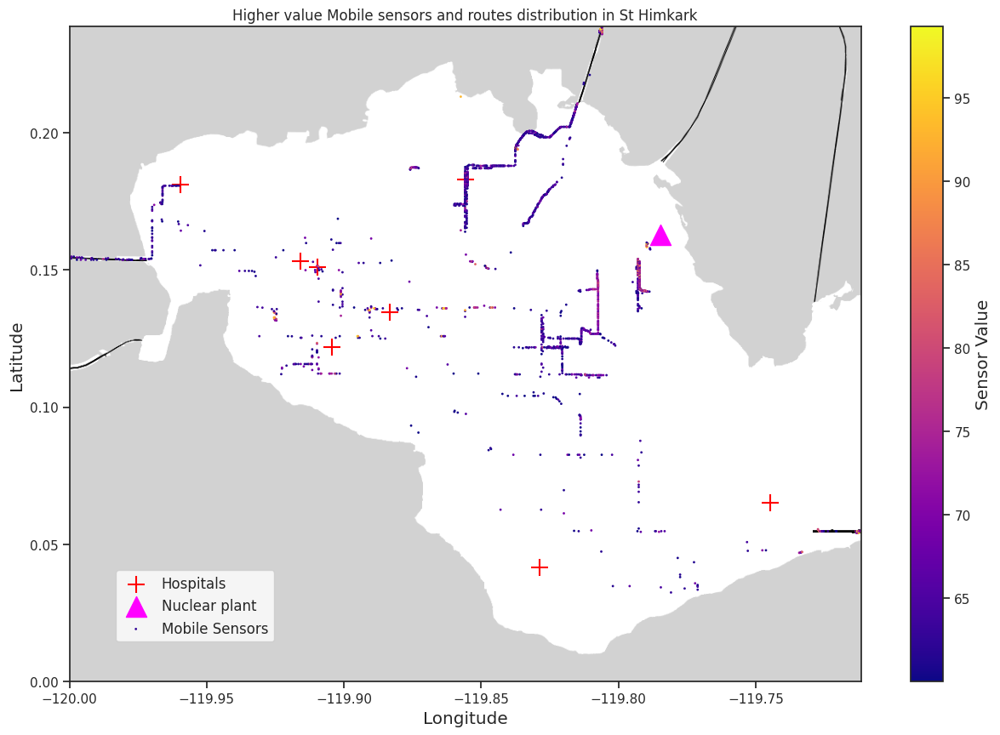

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from PIL import Image
import matplotlib.colors as mcolors

# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# Define the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# Label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_mobile = gpd.GeoDataFrame(avg_mobile_per_location[(avg_mobile_per_location['Value'] > 60) & (avg_mobile_per_location['Value'] <= 100)],geometry='Location')
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])

# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot hospitals and nuclear plant
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_nuclear_plant.plot(ax=ax, color='magenta', marker='^', markersize=300, label='Nuclear plant')

# Create a colormap based on the 'Value' column in gdf_mobile
norm = plt.Normalize(vmin=gdf_mobile['Value'].min(), vmax=gdf_mobile['Value'].max())
cmap = plt.cm.plasma  # You can choose other colormaps like 'plasma', 'inferno', etc.
colors = cmap(norm(gdf_mobile['Value']))

# Plot the GeoDataFrame with color based on 'Value'
gdf_mobile.plot(ax=ax, color=colors, marker='o', markersize= 1, label='Mobile Sensors')

# Add a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation='vertical')
cbar.set_label('Sensor Value', fontsize='large')

# Add labels or other annotations as needed
ax.set_title('Higher value Mobile sensors and routes distribution in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()

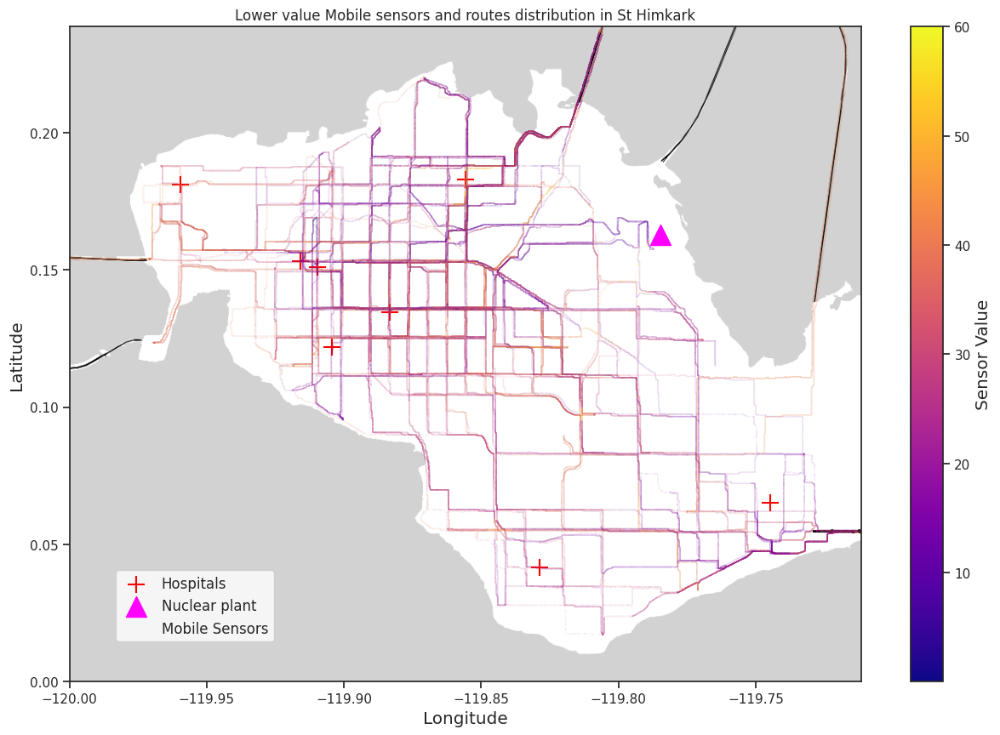

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from PIL import Image
import matplotlib.colors as mcolors

# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# Define the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# Label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_mobile = gpd.GeoDataFrame(avg_mobile_per_location[avg_mobile_per_location['Value'] <=60], geometry='Location')
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])

# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot hospitals and nuclear plant
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_nuclear_plant.plot(ax=ax, color='magenta', marker='^', markersize=300, label='Nuclear plant')

# Create a colormap based on the 'Value' column in gdf_mobile
norm = plt.Normalize(vmin=gdf_mobile['Value'].min(), vmax=gdf_mobile['Value'].max())
cmap = plt.cm.plasma  # You can choose other colormaps like 'plasma', 'inferno', etc.
colors = cmap(norm(gdf_mobile['Value']))

# Plot the GeoDataFrame with color based on 'Value'
gdf_mobile.plot(ax=ax, color=colors, marker='o', markersize= 0.001, label='Mobile Sensors')

# Add a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation='vertical')
cbar.set_label('Sensor Value', fontsize='large')

# Add labels or other annotations as needed
ax.set_title('Lower value Mobile sensors and routes distribution in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()

In [ ]:
mobileDF_remove_zero

,Sensor-id,Long,Lat,Value,Units,User-id,Location,Date,Hour,Minute,Duration,Duration_from_start
Timestamp,,,,,,,,,,,,
2020-04-06 00:00:05,41,-119.883420,0.121800,33.000000,cpm,CitizenScientist,POINT (-119.88342 0.12180),2020-04-06,0,0,0.0,0.0
2020-04-06 00:00:05,27,-119.805700,0.017110,16.000000,cpm,CitizenScientist,POINT (-119.80570 0.01711),2020-04-06,0,0,0.0,0.0
2020-04-06 00:00:05,45,-119.831220,0.062350,40.000000,cpm,CitizenScientist,POINT (-119.83122 0.06235),2020-04-06,0,0,0.0,0.0
2020-04-06 00:00:05,17,-119.925180,0.117450,27.000000,cpm,HiMarkHS,POINT (-119.92518 0.11745),2020-04-06,0,0,0.0,0.0
2020-04-06 00:00:05,28,-119.770900,0.044370,15.000000,cpm,AS-1,POINT (-119.77090 0.04437),2020-04-06,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-04-10 23:59:45,44,-119.890380,0.166068,42.280195,cpm,TaxiDriver,POINT (-119.89038 0.16607),2020-04-10,23,59,1439.0,7199.0
2020-04-10 23:59:45,8,-119.837600,0.175669,16.628476,cpm,MySensor,POINT (-119.83760 0.17567),2020-04-10,23,59,1439.0,7199.0
2020-04-10 23:59:45,41,-119.883546,0.121761,32.440810,cpm,CitizenScientist,POINT (-119.88355 0.12176),2020-04-10,23,59,1439.0,7199.0


In [ ]:
mobileDF_remove_zero_map = mobileDF_remove_zero.copy()

# set up the size of grid
lat_grid_size = 0.01  # above 1.1 km on the equator
lon_grid_size = 0.01  # above 1.1 km on the equator

# add new column of grid
mobileDF_remove_zero_map['Lat_grid'] = (mobileDF_remove_zero_map['Lat'] // lat_grid_size) * lat_grid_size
mobileDF_remove_zero_map['Long_grid'] = (mobileDF_remove_zero_map['Long'] // lon_grid_size) * lon_grid_size


# mean by 1 hour and grid
hourly_avg_mobile_grid = mobileDF_remove_zero_map.groupby([pd.Grouper(freq='h'), 'Lat_grid', 'Long_grid'])['Value'].mean().reset_index()
hourly_avg_mobile_grid


In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import base64
from PIL import Image

# load picture
with open('/content/drive/My Drive/data/StHimarkNeighborhoodMap.png', 'rb') as image_file:
    encoded_image = base64.b64encode(image_file.read()).decode()

# Define the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# sort by time
data_sorted = hourly_avg_mobile_grid.sort_values(by='Timestamp')

# Create the figure
fig = go.Figure()

# Add the static map image
fig.add_layout_image(
    dict(
        source=f'data:image/png;base64,{encoded_image}',
        x=lon_min,
        y=lat_max,
        sizex=lon_max - lon_min,
        sizey=lat_max - lat_min,
        xref="x",
        yref="y",
        xanchor="left",
        yanchor="top",
        layer="below"
    )
)
# Create frames for each time step
frames = [
    go.Frame(
        data=[
            go.Scatter(
                x=hourly_avg_mobile_grid[hourly_avg_mobile_grid['Timestamp'] == timestamp]['Long_grid'],
                y=hourly_avg_mobile_grid[hourly_avg_mobile_grid['Timestamp'] == timestamp]['Lat_grid'],
                mode='markers',
                marker=dict(
                    #size=hourly_avg_mobile_grid[hourly_avg_mobile_grid['Timestamp'] == timestamp]['Value'],  # Adjust size based on 'Value'
                    size = 10,
                    color=hourly_avg_mobile_grid[hourly_avg_mobile_grid['Timestamp'] == timestamp]['Value'],
                    colorscale='Viridis',
                    colorbar=dict(title='Value'),
                ),
                showlegend=False
            )
        ],
        name=str(timestamp)
    )
    for timestamp in hourly_avg_mobile_grid['Timestamp'].unique()
]

    # Add the frames to the figure
fig.frames = frames

# Add the initial trace
fig.add_trace(
    go.Scatter(
        x=hourly_avg_mobile_grid['Long_grid'],
        y=hourly_avg_mobile_grid['Lat_grid'],
        mode='markers',
        marker=dict(
            size=hourly_avg_mobile_grid['Value'],
            color=hourly_avg_mobile_grid['Value'],
            colorscale='Viridis',
            colorbar=dict(title='Value'),
        ),
        showlegend=False
    )
)
fig.update_layout(
    title='Sensor Values Over Time with mobile Map Background',
    xaxis=dict(
        range=[lon_min, lon_max],
        title='Longitude',
        zeroline=False,
        showgrid=False,
        scaleanchor='y',
        scaleratio=1
    ),
    yaxis=dict(
        range=[lat_min, lat_max],
        title='Latitude',
        zeroline=False,
        showgrid=False,
        scaleanchor='x',
        scaleratio=1
    ),
    updatemenus=[
        {
            'buttons': [
                {
                    'args': [None, {'frame': {'duration': 1000, 'redraw': True}, 'fromcurrent': True}],
                    'label': 'Play',
                    'method': 'animate',
                },
                {
                    'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
                    'label': 'Pause',
                    'method': 'animate',
                }
            ],
            'direction': 'left',
            'pad': {'r': 10, 't': 50},
            'showactive': True,
            'type': 'buttons',
            'x': 0.1,
            'xanchor': 'right',
            'y': 0,
            'yanchor': 'top'
        }
    ],
    sliders=[{
        'steps': [
            {
                'label': str(timestamp),
                'method': 'animate',
                'args': [[str(timestamp)], {'mode': 'immediate', 'frame': {'duration': 500, 'redraw': True}, 'transition': {'duration': 300}}],
            }
            for timestamp in hourly_avg_location['Timestamp'].unique()
        ],
        'currentvalue': {'prefix': 'Timestamp: '}
    }]
)



# Save the figure to an HTML file
fig.write_html('mobile sensor per hour and location.html')

# Optionally display the plot in a Jupyter Notebook
fig.show()

In [ ]:
mobileDF_remove_zero_map = mobileDF_remove_zero.copy()

# set up the size of grid
lat_grid_size = 0.01  # above 1.1 km on the equator
lon_grid_size = 0.01  # above 1.1 km on the equator

# add new column of grid
mobileDF_remove_zero_map['Lat_grid'] = (mobileDF_remove_zero_map['Lat'] // lat_grid_size) * lat_grid_size
mobileDF_remove_zero_map['Long_grid'] = (mobileDF_remove_zero_map['Long'] // lon_grid_size) * lon_grid_size


# mean by 1 hour and grid
ten_minute_avg_mobile_grid = mobileDF_remove_zero_map.groupby([pd.Grouper(freq='10 min'), 'Lat_grid', 'Long_grid'])['Value'].mean().reset_index()
ten_minute_avg_mobile_grid

,Timestamp,Lat_grid,Long_grid,Value
0,2020-04-06 00:00:00,0.01,-119.81,21.811765
1,2020-04-06 00:00:00,0.02,-119.85,23.932773
2,2020-04-06 00:00:00,0.03,-119.83,26.722689
3,2020-04-06 00:00:00,0.04,-119.78,13.773109
4,2020-04-06 00:00:00,0.04,-119.77,20.563025
...,...,...,...,...
31532,2020-04-10 23:50:00,0.19,-119.91,15.736521
31533,2020-04-10 23:50:00,0.19,-119.90,15.032197
31534,2020-04-10 23:50:00,0.19,-119.89,23.342466
31535,2020-04-10 23:50:00,0.19,-119.86,25.550486


In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import base64
from PIL import Image

# load picture
with open('/content/drive/My Drive/data/StHimarkNeighborhoodMap.png', 'rb') as image_file:
    encoded_image = base64.b64encode(image_file.read()).decode()

# Define the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# sort by time
data_sorted = ten_minute_avg_mobile_grid.sort_values(by='Timestamp')

# Create the figure
fig = go.Figure()

# Add the static map image
fig.add_layout_image(
    dict(
        source=f'data:image/png;base64,{encoded_image}',
        x=lon_min,
        y=lat_max,
        sizex=lon_max - lon_min,
        sizey=lat_max - lat_min,
        xref="x",
        yref="y",
        xanchor="left",
        yanchor="top",
        layer="below"
    )
)
# Create frames for each time step
frames = [
    go.Frame(
        data=[
            go.Scatter(
                x=ten_minute_avg_mobile_grid[ten_minute_avg_mobile_grid['Timestamp'] == timestamp]['Long_grid'],
                y=ten_minute_avg_mobile_grid[ten_minute_avg_mobile_grid['Timestamp'] == timestamp]['Lat_grid'],
                mode='markers',
                marker=dict(
                    #size=hourly_avg_mobile_grid[hourly_avg_mobile_grid['Timestamp'] == timestamp]['Value'],  # Adjust size based on 'Value'
                    size = 10,
                    color=ten_minute_avg_mobile_grid[ten_minute_avg_mobile_grid['Timestamp'] == timestamp]['Value'],
                    colorscale='Viridis',
                    colorbar=dict(title='Value'),
                ),
                showlegend=False
            )
        ],
        name=str(timestamp)
    )
    for timestamp in ten_minute_avg_mobile_grid['Timestamp'].unique()
]

    # Add the frames to the figure
fig.frames = frames

# Add the initial trace
fig.add_trace(
    go.Scatter(
        x=ten_minute_avg_mobile_grid['Long_grid'],
        y=ten_minute_avg_mobile_grid['Lat_grid'],
        mode='markers',
        marker=dict(
            #size=ten_minute_avg_mobile_grid['Value'],
            size = 10,
            color=ten_minute_avg_mobile_grid['Value'],
            colorscale='Viridis',
            colorbar=dict(title='Value'),
        ),
        showlegend=False
    )
)
fig.update_layout(
    title='Sensor Values Over Time with Mobile Map Background per 10 minutes',
    xaxis=dict(
        range=[lon_min, lon_max],
        title='Longitude',
        zeroline=False,
        showgrid=False,
        scaleanchor='y',
        scaleratio=1
    ),
    yaxis=dict(
        range=[lat_min, lat_max],
        title='Latitude',
        zeroline=False,
        showgrid=False,
        scaleanchor='x',
        scaleratio=1
    ),
    updatemenus=[
        {
            'buttons': [
                {
                    'args': [None, {'frame': {'duration': 1000, 'redraw': True}, 'fromcurrent': True}],
                    'label': 'Play',
                    'method': 'animate',
                },
                {
                    'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
                    'label': 'Pause',
                    'method': 'animate',
                }
            ],
            'direction': 'left',
            'pad': {'r': 10, 't': 50},
            'showactive': True,
            'type': 'buttons',
            'x': 0.1,
            'xanchor': 'right',
            'y': 0,
            'yanchor': 'top'
        }
    ],
    sliders=[{
        'steps': [
            {
                'label': str(timestamp),
                'method': 'animate',
                'args': [[str(timestamp)], {'mode': 'immediate', 'frame': {'duration': 500, 'redraw': True}, 'transition': {'duration': 300}}],
            }
            for timestamp in hourly_avg_location['Timestamp'].unique()
        ],
        'currentvalue': {'prefix': 'Timestamp: '}
    }]
)



# Save the figure to an HTML file
fig.write_html('mobile sensor per 10 minutes and location.html')

# Optionally display the plot in a Jupyter Notebook
fig.show()